# CMPINF 2100: Midterm exam

## YOUR NAME HERE !!!!

You may add as many code and markdown cells as you see fit to answer the questions.

## You are NOT allowed to collaborate with anyone on this exam.

### Overview

You will demonstrate your ability to merge, group, summarize, visualize, and find patterns in data. This exam uses data associated with a manufacturing example. An overview of the goals, considerations, CSV files, and variables within the data is provided in a presentation on Canvas. Please read through those slides before starting the exam.

The data are provided in 5 separate CSV files. The CSV files are available on Canvas. You **MUST** download the files and save them to the same working directory as this notebook.

The specific instructions in this notebook tell you when you must JOIN the data together. Please read the problems carefully.

The overall objective of this exam is to JOIN data from multiple files in order to explore and find interesting patterns between the machine operating conditions and supplier information. You will report your findings within this notebook by displaying Pandas DataFrames and statistical visualizations via Seaborn and matplotlib when necessary.  

## Import modules

You are permitted to use the following modules on this exam.

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns

You may also use the following functions from scikit-learn on this exam.

In [2]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

You may also use the following sub module from SCIPY.

In [3]:
from scipy.cluster import hierarchy

In [4]:
sns.set_palette("colorblind")

You are **NOT** permitted to use any other modules or functions. However, you **ARE** permitted to create your own user defined functions if you would like.

## Shortcuts

* [Problem 01](#Problem-01)
* [Problem 02](#Problem-02)
* [Problem 03](#Problem-03)
* [Problem 04](#Problem-04)
* [Problem 05](#Problem-05)

## Problem 01

The file names for the 3 machine data sets are provided as strings in the cell below. You are required to read in the CSV files and assign the data to the `m01_df`, `m02_df`, and `m03_df` objects. The data from machine 1 will therefore be associated with `m01_df`, machine 2 is associated with `m02_df`, and machine 3 is associated with `m03_df`.  

In this problem you must explore each of the three machine data sets. 

You must perform the following **ESSENTIAL** activities:

* How many rows and columns are in each data set? 
* What are the names and data types for each column?
* How many unique values are there for each column?
* How many missing values are there for each column?

You must visually explore the MARGINAL behavior of the variables in the data. You must use visualizations appropriate for the DATA TYPE of the columns.

You must visually explore RELATIONSHIPS between variables in the data. You must use visualizations appropriate for the DATA TYPES. You must make sure that your visualizations can answer the following questions:

* How many unique values for `Batch` are associated with each MACHINE (data set)?
* How many cell phone cases are associated with each `Batch` value for each MACHINE (data set)?
* Do the summary statistics of the OPERATING VARIABLES `x1` through `x4` vary across the three MACHINES?
* Do the summary statistics of the OPERATING VARIABLES `x1` through `x4` vary across the `Batch` values?
* Do the relationships between the OPERATING VARIABLES `x1` through `x4` vary across the three MACHINES?
* Do the relationships between the OPERATING VARIABLES `x1` through `x4` vary across the `Batch` values?

At the conclusion of this problem, you **MUST** CONCATENATE the 3 MACHINE data sets into a single DataFrame. The single DataFrame must be named `machine_df`. Before concatenating, you **MUST** add a column `machine_id` to each DataFrame with the correct index value for that machine (1, 2, or 3). The concatenating DataFrame variable name is provided as a reminder to you below. 

You may add as many markdown and code cells as you see fit to answer this question. Include markdown cells stating what you see in the figures and why you selected to use them.

### SOLUTION

In [17]:
# Define the files's for the 3 machine level CSV files

file_m01 = 'midterm_machine_01.csv'

file_m02 = 'midterm_machine_02.csv'

file_m03 = 'midterm_machine_03.csv'

In [18]:
# read in the CSV files and name them accordingly

m01_df = pd.read_csv(file_m01)
m01_df.name = "m01_df"

m02_df = pd.read_csv(file_m02)
m02_df.name = "m02_df"

m03_df = pd.read_csv(file_m03)
m03_df.name = "m03_df"

#### Essential EDA of the dataframes

In [19]:
# shape of the dataframes

for mxx_df in [m01_df, m02_df, m03_df]:
    print(f'Shape of {mxx_df.name} is {mxx_df.shape[0]} rows and {mxx_df.shape[1]} columns')
    print('-'*43)


Shape of m01_df is 5152 rows and 7 columns
-------------------------------------------
Shape of m02_df is 5119 rows and 7 columns
-------------------------------------------
Shape of m03_df is 4458 rows and 7 columns
-------------------------------------------


In [20]:
for mxx_df in [m01_df, m02_df, m03_df]:
    print(f'Names and Data types for each column in {mxx_df.name}:')
    mxx_df.info()
    print('-'*30)

Names and Data types for each column in m01_df:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5152 entries, 0 to 5151
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ID      5152 non-null   object 
 1   Batch   5152 non-null   int64  
 2   s_id    5152 non-null   int64  
 3   x1      5152 non-null   float64
 4   x2      5152 non-null   float64
 5   x3      5152 non-null   float64
 6   x4      5152 non-null   float64
dtypes: float64(4), int64(2), object(1)
memory usage: 281.9+ KB
------------------------------
Names and Data types for each column in m02_df:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5119 entries, 0 to 5118
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ID      5119 non-null   object 
 1   Batch   5119 non-null   int64  
 2   s_id    5119 non-null   int64  
 3   x1      5119 non-null   float64
 4   x2      5119 non-null   float64
 5   

In [21]:
for mxx_df in [m01_df, m02_df, m03_df]:
    print(f'Missing Values in {mxx_df.name}:\n{mxx_df.isna().sum()}')
    print('-'*30)

Missing Values in m01_df:
ID       0
Batch    0
s_id     0
x1       0
x2       0
x3       0
x4       0
dtype: int64
------------------------------
Missing Values in m02_df:
ID       0
Batch    0
s_id     0
x1       0
x2       0
x3       0
x4       0
dtype: int64
------------------------------
Missing Values in m03_df:
ID       0
Batch    0
s_id     0
x1       0
x2       0
x3       0
x4       0
dtype: int64
------------------------------


#### Data Analysis of each machine dataset

First convert the variables `ID`, `Batch` and `s_id` to categorical

In [22]:
for mxx_df in [m01_df, m02_df, m03_df]:
    mxx_df['Batch'] = mxx_df['Batch'].astype('object')
    mxx_df['ID'] = mxx_df['ID'].astype('object')
    mxx_df['s_id'] = mxx_df['s_id'].astype('object')

##### Machine 1 - `m01_df`

###### **Descriptive Statistics for numerical variables**

In [23]:
m01_df.describe()

,x1,x2,x3,x4
count,5152.000000,5152.000000,5152.000000,5152.000000
mean,51.998218,102.207011,23.947216,10.628436
std,3.151912,12.888171,2.269325,1.542291
min,44.275379,65.810729,19.095832,7.644190
25%,49.335776,96.610288,22.334048,9.479969
50%,52.536206,104.487824,23.855690,10.356002
75%,54.662490,110.609442,25.448356,11.318120
max,58.647186,130.228828,29.477213,14.612911


###### Descriptive Statistics for categorical variables

In [24]:
m01_df.describe(include='object')

,ID,Batch,s_id
count,5152,5152,5152
unique,5152,50,149
top,B001-M01-S001,36,1
freq,1,149,50


###### MARGINAL behavior of Categorical Variables

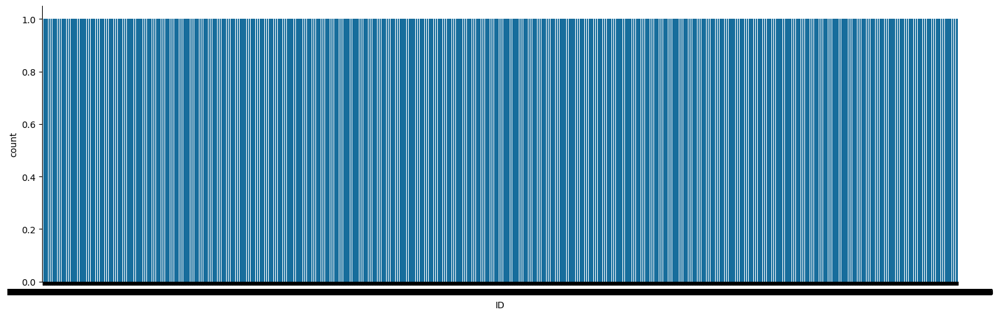

In [15]:
sns.catplot( data = m01_df, x='ID', kind='count', aspect=3 )

plt.show()

`ID` is unique for the cell phone case. The above plot tells us that each row in the dataset represents one unique cell phone case

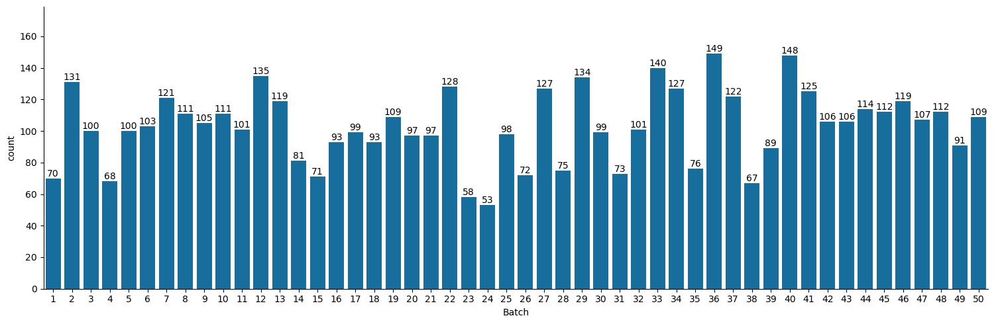

In [25]:
h = sns.catplot(data=m01_df, x='Batch', kind='count', aspect=3)

h.fig.subplots_adjust(top=0.9)

for ax in h.axes.ravel():
    
    # add annotations
    for c in ax.containers:
        labels = [f'{(v.get_height()):.0f}' for v in c]
        ax.bar_label(c, labels=labels, label_type='edge')
    ax.margins(y=0.2)
plt.tight_layout()
plt.show()

Above plot shows number of cell phone cases manufactured per `Batch`

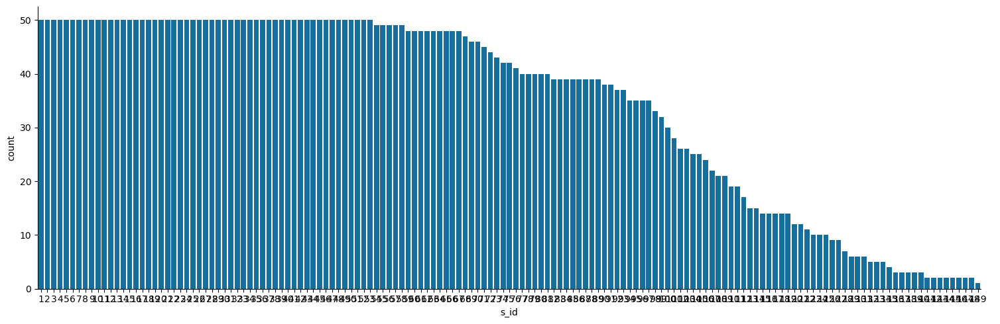

In [30]:
sns.catplot( data = m01_df, x='s_id', kind='count', aspect=3)

`s_id` The sequential production index for a single cell phone case within a Batch on a machine

###### MARGINAL behavior of Continuous Variables

First will create a LONG FORMAT representation of the given machine dataset

In [34]:
df_features = m01_df.select_dtypes('number').copy()
df_objects = m01_df.select_dtypes('object').copy()
id_cols = ['rowid'] + df_objects.columns.to_list()
m01_df_lf = m01_df.reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=id_cols, value_vars=df_features.columns)

In [35]:
m01_df_lf

,rowid,ID,Batch,s_id,variable,value
0,0,B001-M01-S001,1,1,x1,50.117118
1,1,B001-M01-S002,1,2,x1,46.887333
2,2,B001-M01-S003,1,3,x1,50.132744
3,3,B001-M01-S004,1,4,x1,48.501042
4,4,B001-M01-S005,1,5,x1,49.690442
...,...,...,...,...,...,...
20603,5147,B050-M01-S105,50,105,x4,11.456779
20604,5148,B050-M01-S106,50,106,x4,11.048374
20605,5149,B050-M01-S107,50,107,x4,10.697194
20606,5150,B050-M01-S108,50,108,x4,11.052844


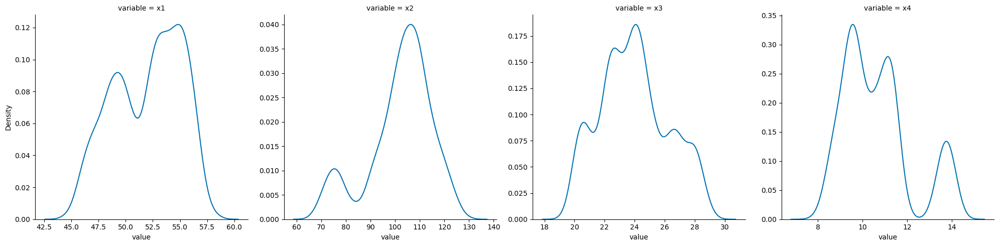

In [36]:
sns.displot(data = m01_df_lf, x='value', col='variable', kind='kde',
            facet_kws={'sharex': False, 'sharey': False},
            common_norm=False)

plt.show()

* x1,x3 symmetrical
* x2 moderate negative skew
* x4 moderate positive skew

**Do the summary statistics of the OPERATING VARIABLES x1 through x4 vary across the Batch values?**

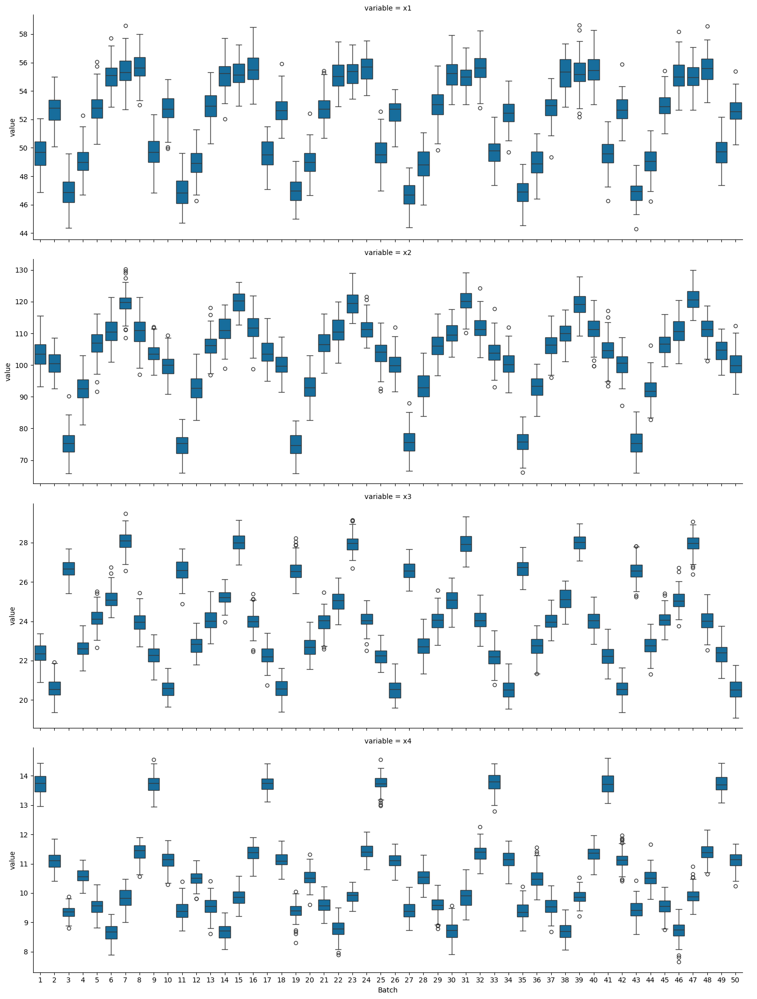

In [37]:
sns.catplot(data = m01_df_lf, x='Batch', y='value', col='variable', col_wrap=1, aspect=3,
            kind='box',
            sharey=False)

plt.show()

Based on the above plot, yes, summary statistics of the OPERATING VARIABLES x1 through x4 vary across the Batch values

**Do the relationships between the OPERATING VARIABLES x1 through x4 vary across the Batch values?**

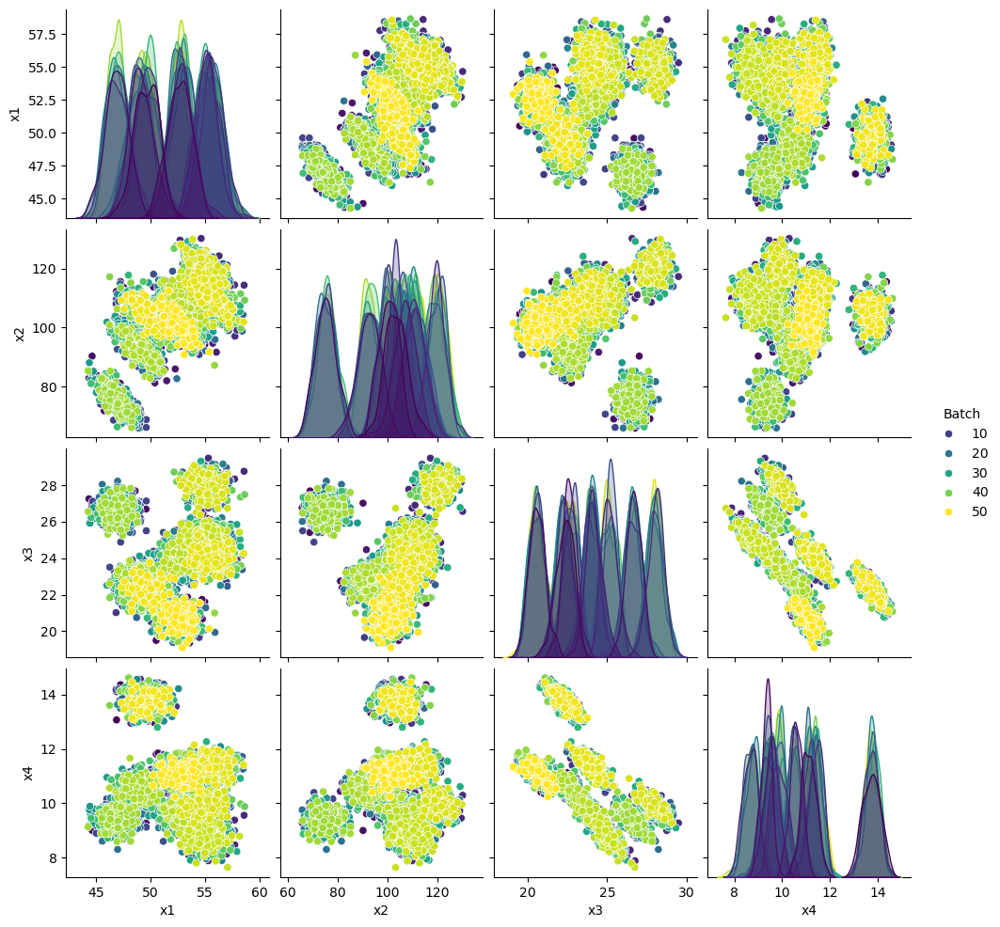

In [45]:
sns.pairplot(data=m01_df[['x1', 'x2', 'x3', 'x4', 'Batch']], 
             hue='Batch',  
             diag_kws={'common_norm': False},
             palette='viridis')

plt.show()

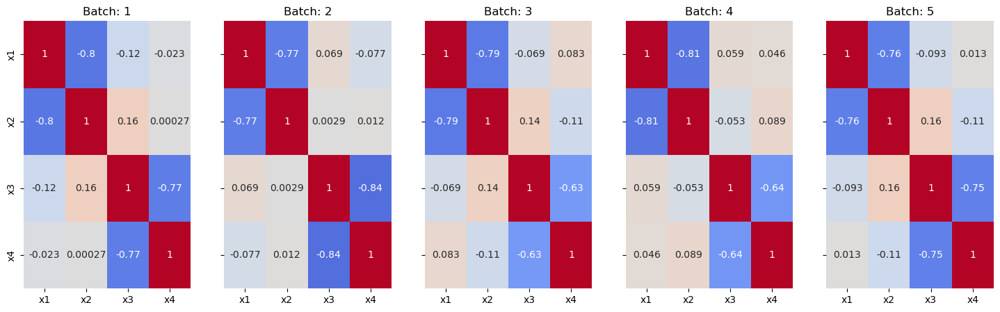

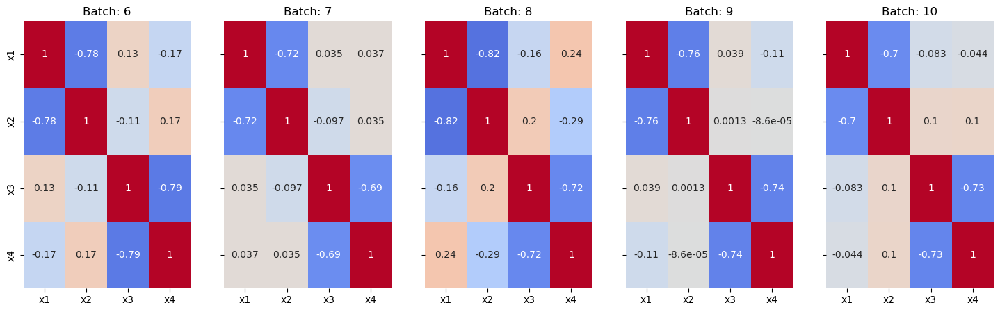

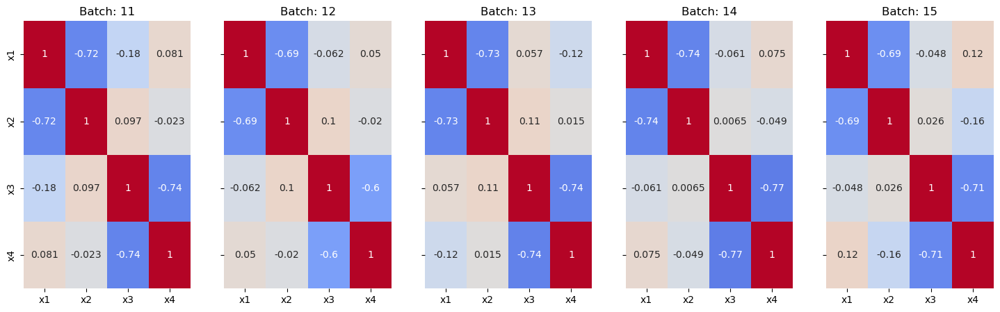

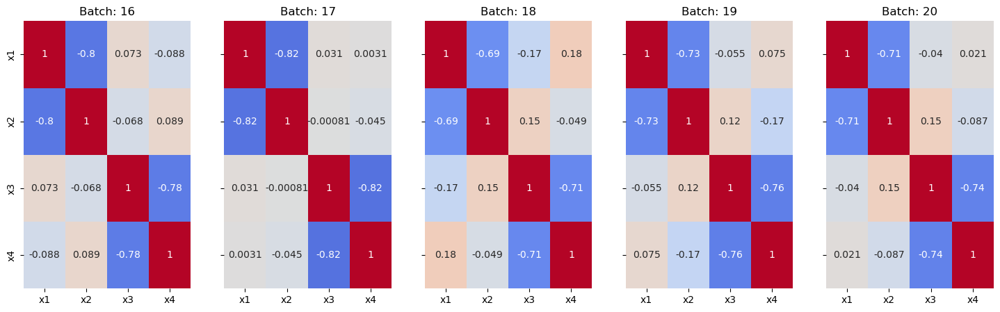

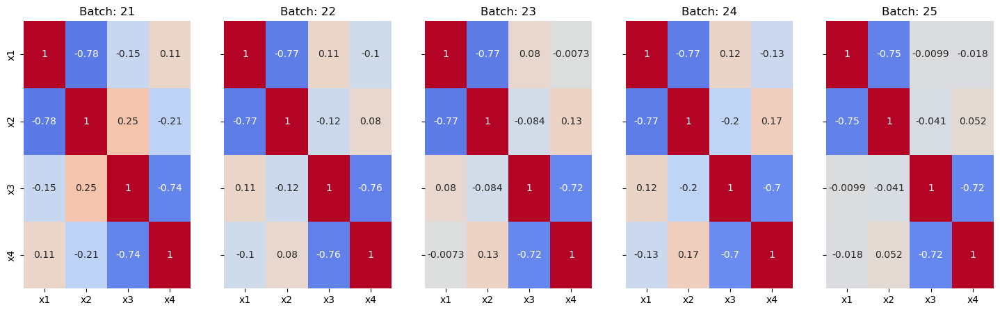

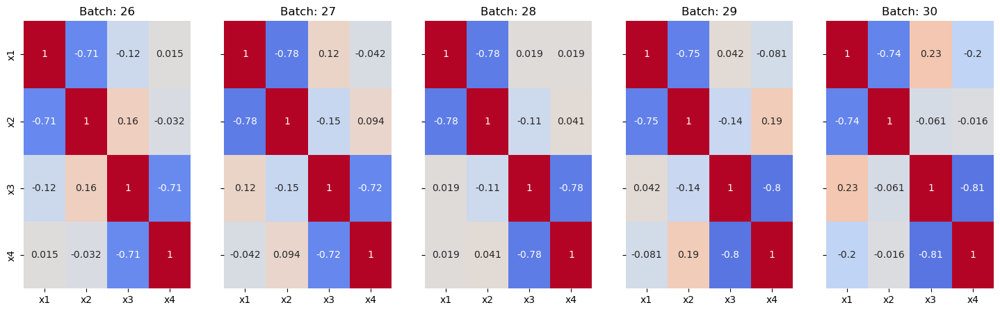

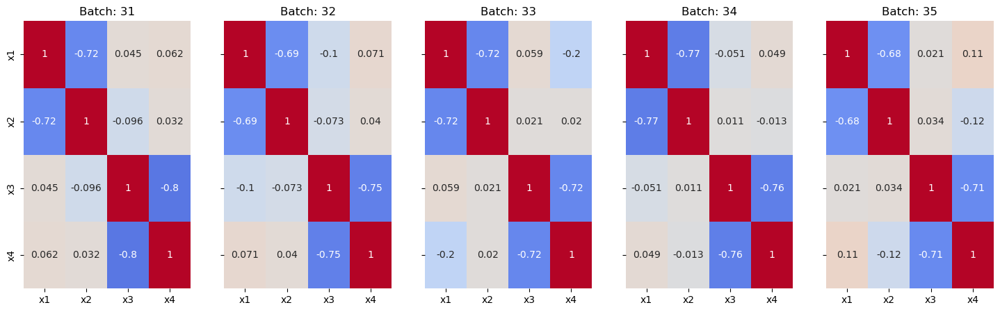

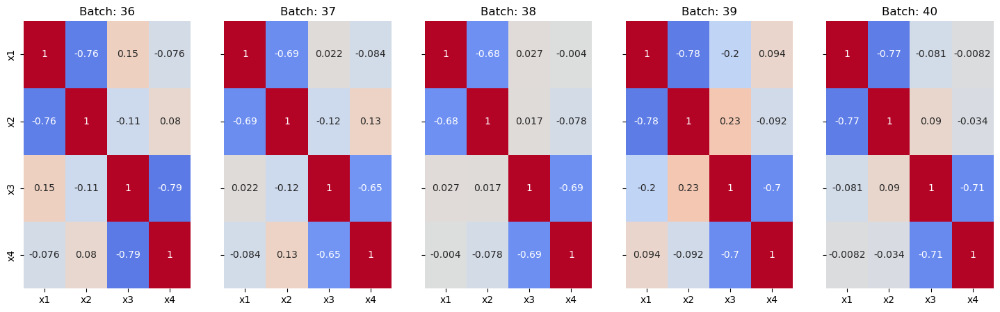

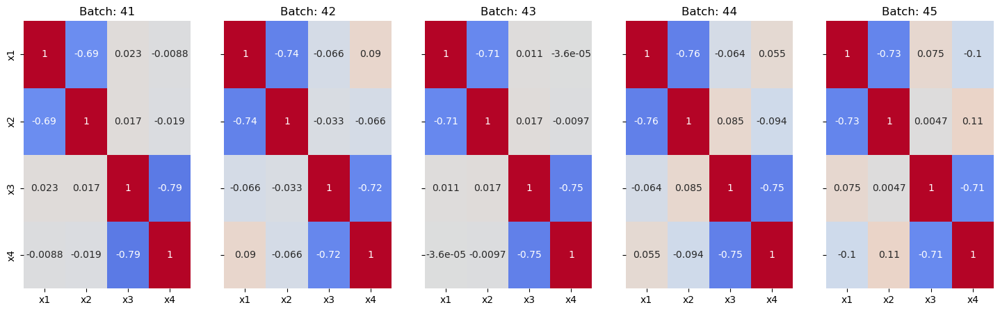

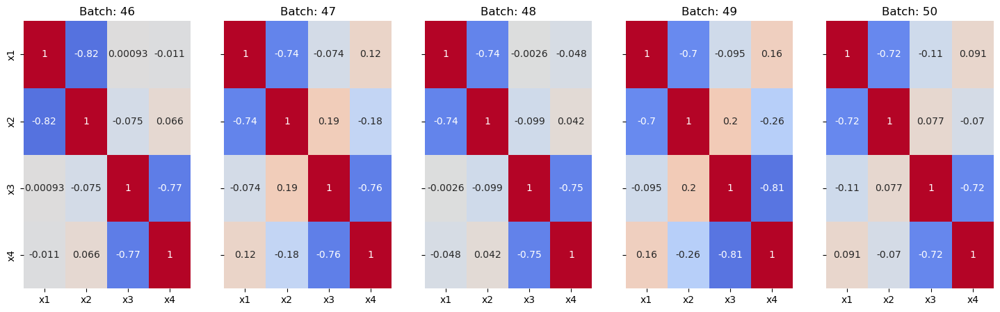

In [75]:
the_groups = m01_df.Batch.unique().tolist()

corr_per_group = m01_df.loc[ :, ['Batch', 'x1', 'x2', 'x3', 'x4']].groupby(['Batch']).corr()

subgroups = [the_groups[i:i + 5] for i in range(0, len(the_groups), 5)] # Done so that the plot isn't cluttered

for sg in subgroups:
    fig, axs = plt.subplots(1, len(sg), figsize=(18, 5), sharex=True, sharey=True )

    for i in range(len(sg)):
        sns.heatmap( data = corr_per_group.loc[ sg[ i ] ],
                     vmin=-1, vmax=1, center = 0,
                     cmap='coolwarm', cbar=False,
                     annot=True, annot_kws={'size': 10},
                     ax=axs[i] )

        axs[i].set_title('Batch: %s' % sg[ i ] )

    plt.show()

Based on the above pair plot and correlation plot we can confirm that the relationships between the operating variables vary across Batch values

##### Machine 2 - `m02_df`

###### **Descriptive Statistics for numerical variables**

In [76]:
m02_df.describe()

,x1,x2,x3,x4
count,5119.000000,5119.000000,5119.000000,5119.000000
mean,51.989377,101.998905,23.982312,10.605275
std,3.095129,12.834348,2.275809,1.523140
min,44.896759,64.774007,19.232164,7.934064
25%,49.240567,96.325502,22.372944,9.492226
50%,52.610949,104.357308,23.894465,10.329911
75%,54.785418,110.672960,25.546656,11.286062
max,58.503441,131.009046,29.093229,14.400437


###### Descriptive Statistics for categorical variables

In [77]:
m02_df.describe(include='object')

,ID,Batch,s_id
count,5119,5119,5119
unique,5119,50,133
top,B001-M02-S001,43,1
freq,1,133,50


###### MARGINAL behavior of Categorical Variables

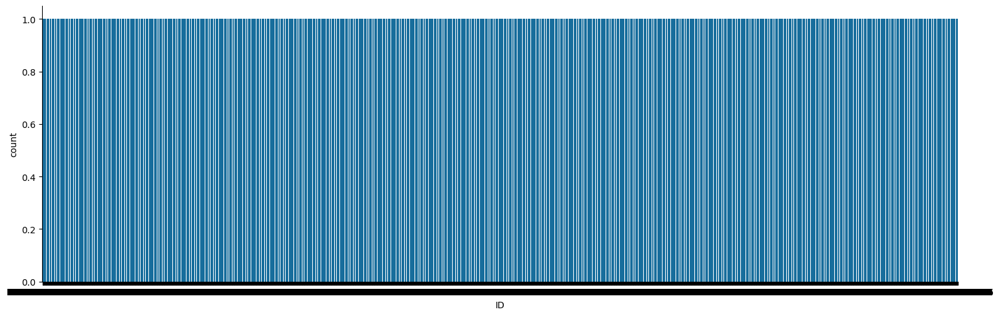

In [78]:
sns.catplot( data = m02_df, x='ID', kind='count', aspect=3 )

plt.show()

`ID` is unique for the cell phone case. The above plot tells us that each row in the dataset represents one unique cell phone case

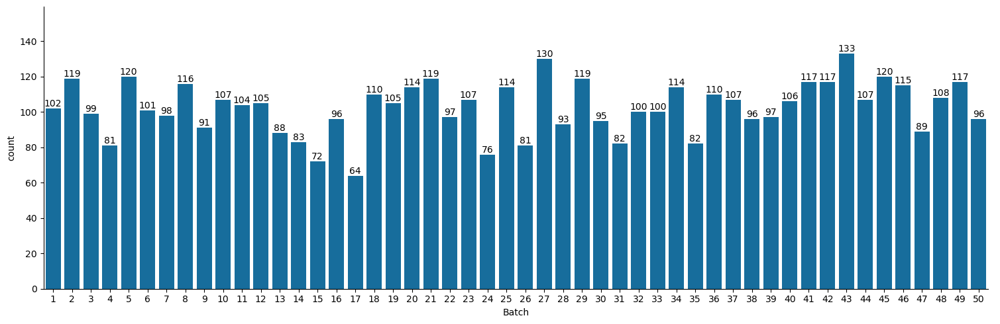

In [79]:
h = sns.catplot(data=m02_df, x='Batch', kind='count', aspect=3)

h.fig.subplots_adjust(top=0.9)

for ax in h.axes.ravel():
    
    # add annotations
    for c in ax.containers:
        labels = [f'{(v.get_height()):.0f}' for v in c]
        ax.bar_label(c, labels=labels, label_type='edge')
    ax.margins(y=0.2)
plt.tight_layout()
plt.show()

Above plot shows number of cell phone cases manufactured per `Batch`

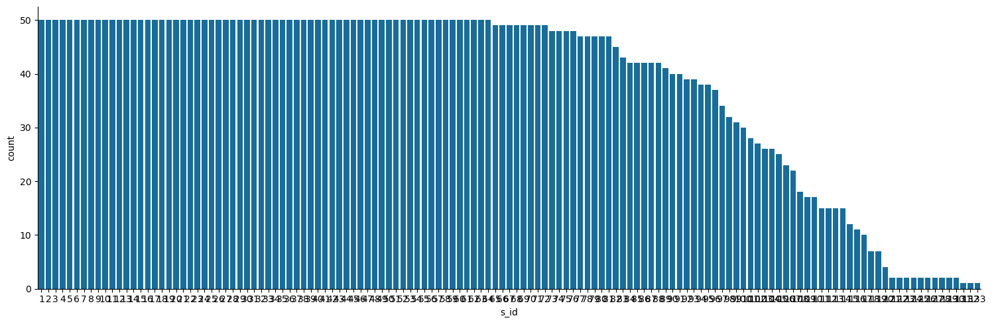

In [80]:
sns.catplot( data = m02_df, x='s_id', kind='count', aspect=3)

`s_id` The sequential production index for a single cell phone case within a Batch on a machine

###### MARGINAL behavior of Continuous Variables

First will create a LONG FORMAT representation of the given machine dataset

In [81]:
df_features = m02_df.select_dtypes('number').copy()
df_objects = m02_df.select_dtypes('object').copy()
id_cols = ['rowid'] + df_objects.columns.to_list()
m02_df_lf = m02_df.reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=id_cols, value_vars=df_features.columns)

In [82]:
m02_df_lf

,rowid,ID,Batch,s_id,variable,value
0,0,B001-M02-S001,1,1,x1,50.213596
1,1,B001-M02-S002,1,2,x1,49.811232
2,2,B001-M02-S003,1,3,x1,48.968142
3,3,B001-M02-S004,1,4,x1,50.477133
4,4,B001-M02-S005,1,5,x1,50.188501
...,...,...,...,...,...,...
20471,5114,B050-M02-S092,50,92,x4,10.963370
20472,5115,B050-M02-S093,50,93,x4,11.156604
20473,5116,B050-M02-S094,50,94,x4,11.303222
20474,5117,B050-M02-S095,50,95,x4,11.084512


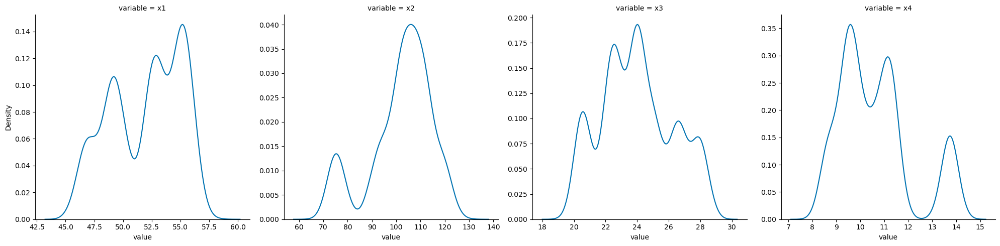

In [83]:
sns.displot(data = m02_df_lf, x='value', col='variable', kind='kde',
            facet_kws={'sharex': False, 'sharey': False},
            common_norm=False)

plt.show()

* x1,x3 symmetrical
* x2 moderate negative skew
* x4 moderate positive skew

**Do the summary statistics of the OPERATING VARIABLES x1 through x4 vary across the Batch values?**

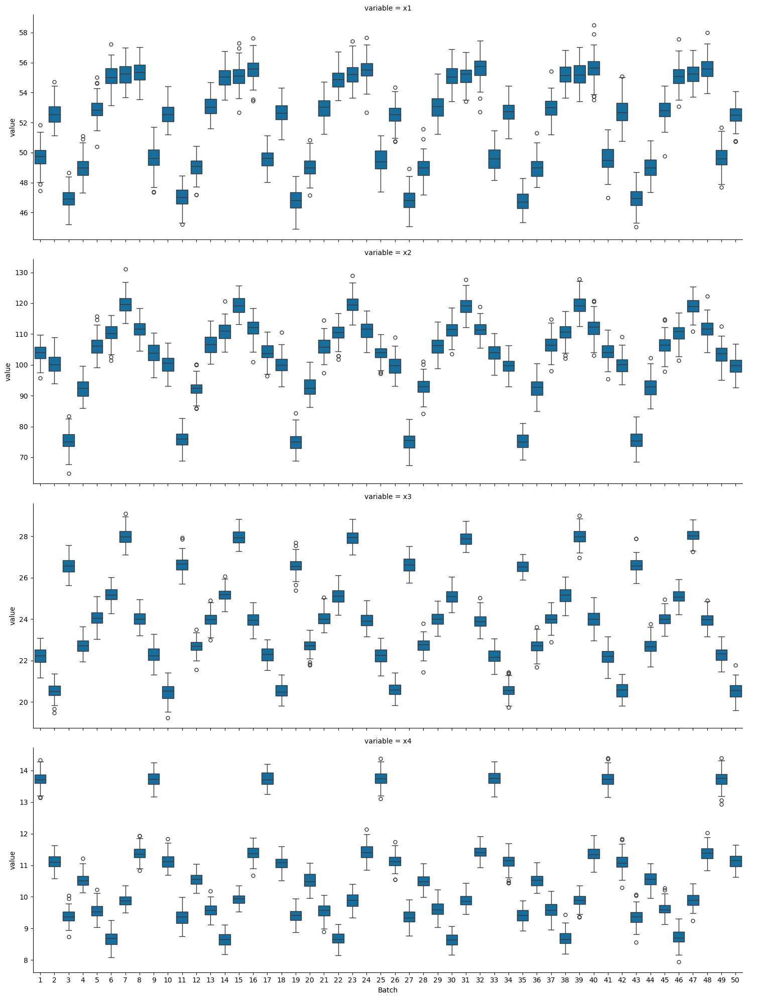

In [84]:
sns.catplot(data = m02_df_lf, x='Batch', y='value', col='variable', col_wrap=1, aspect=3,
            kind='box',
            sharey=False)

plt.show()

Based on the above plot, yes, summary statistics of the OPERATING VARIABLES x1 through x4 vary across the Batch values

**Do the relationships between the OPERATING VARIABLES x1 through x4 vary across the Batch values?**

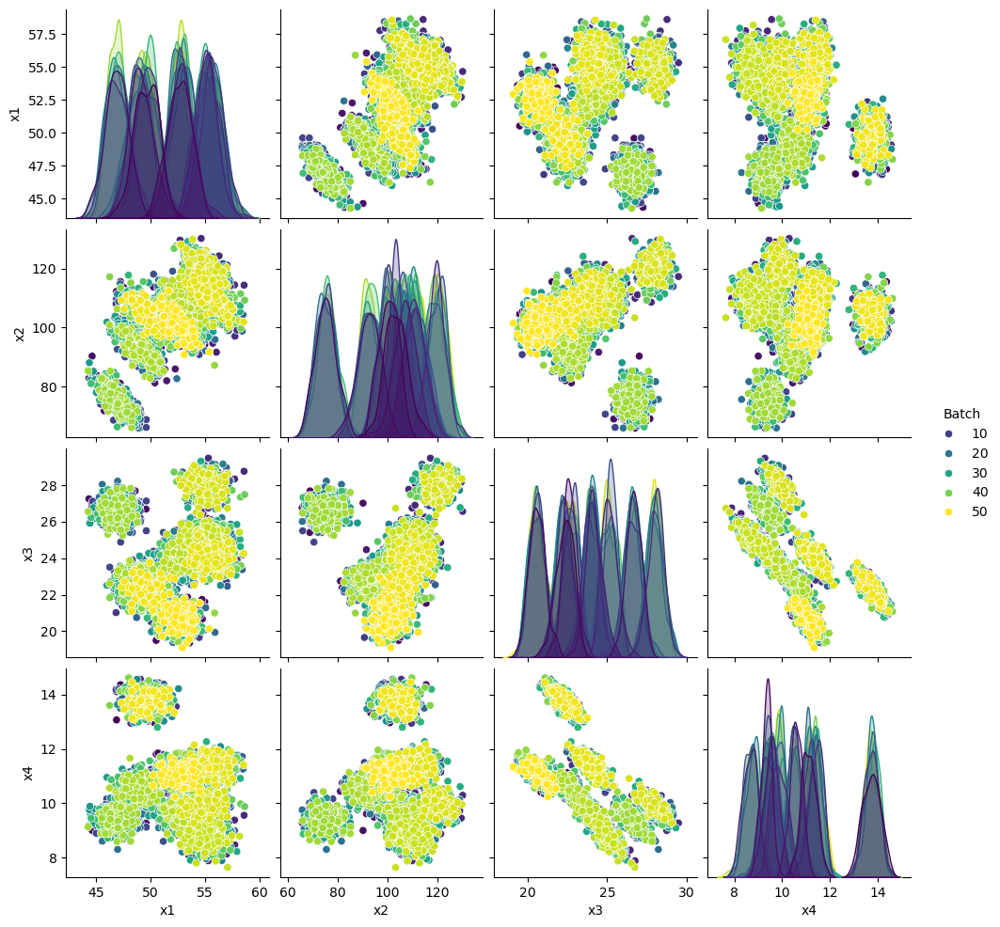

In [45]:
sns.pairplot(data=m02_df[['x1', 'x2', 'x3', 'x4', 'Batch']], 
             hue='Batch',  
             diag_kws={'common_norm': False},
             palette='viridis')

plt.show()

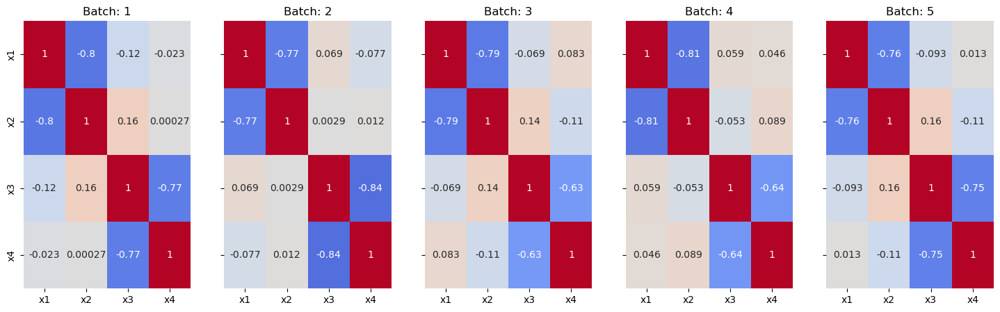

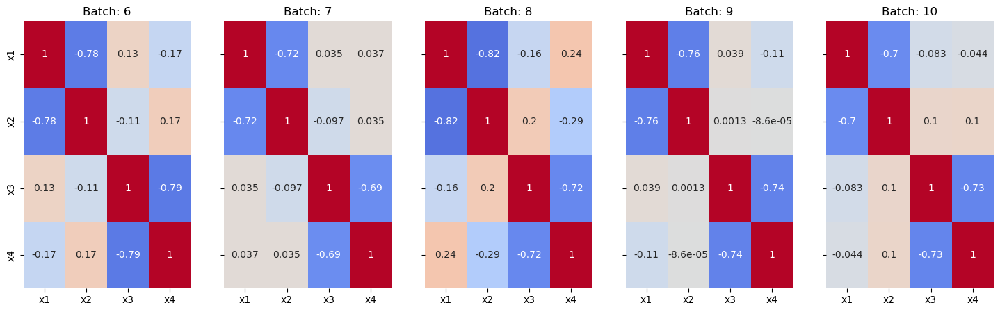

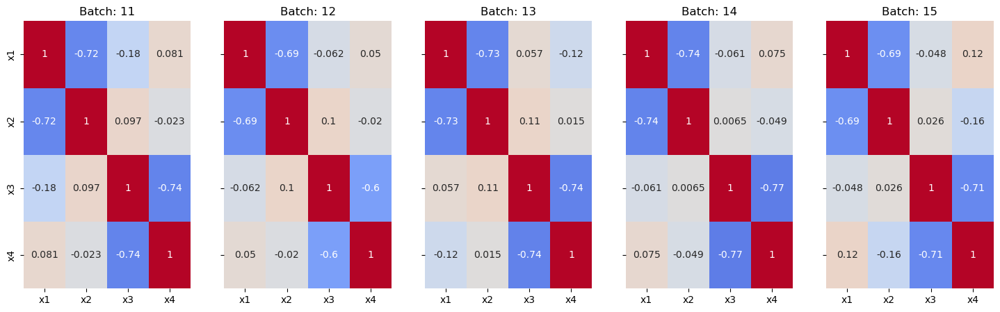

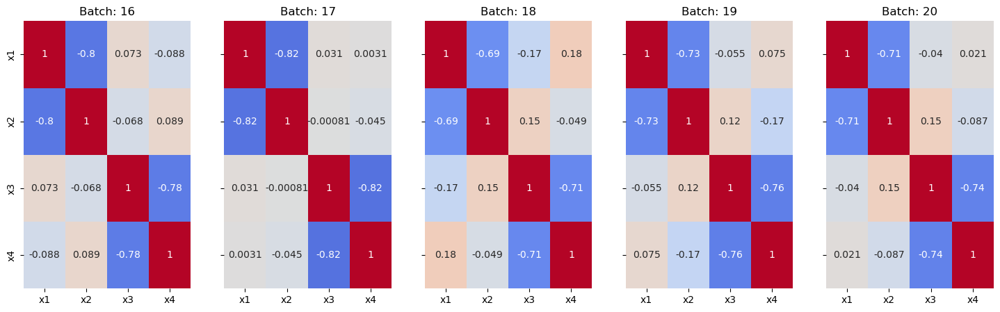

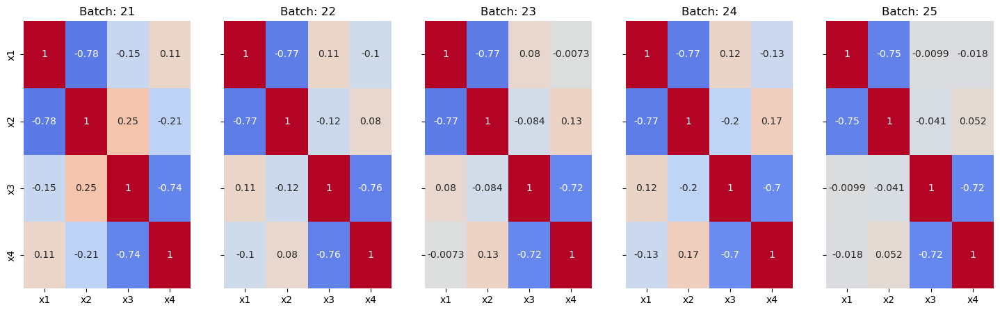

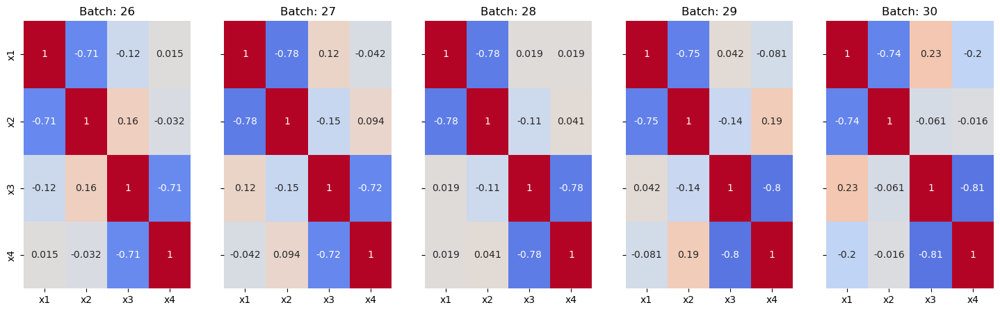

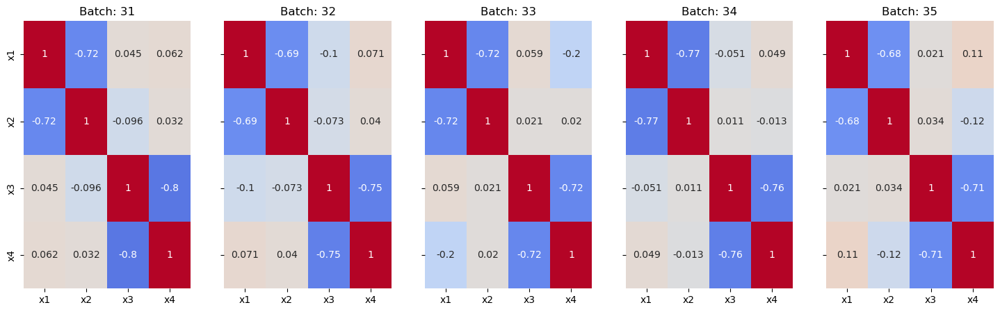

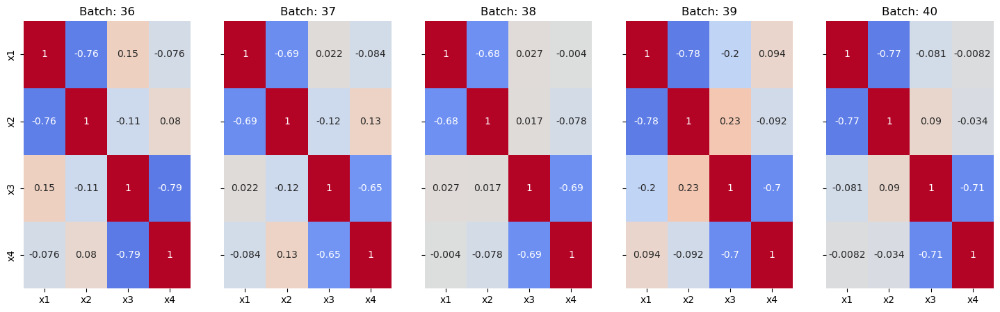

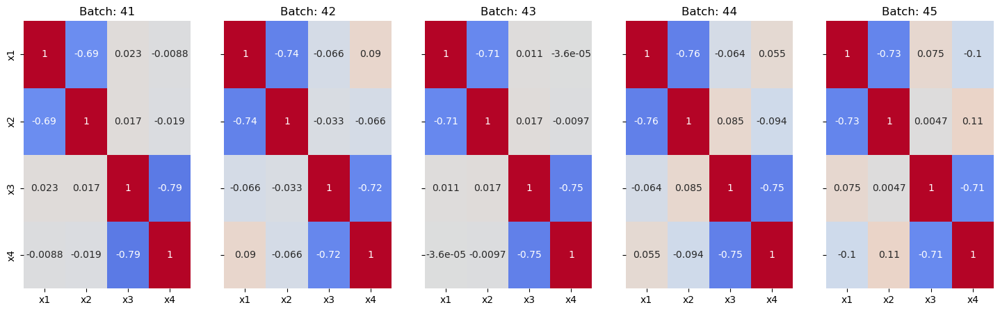

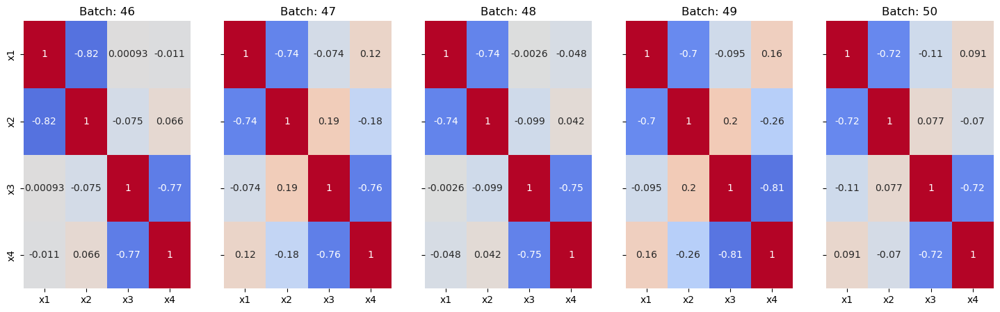

In [75]:
the_groups = m02_df.Batch.unique().tolist()

corr_per_group = m02_df.loc[ :, ['Batch', 'x1', 'x2', 'x3', 'x4']].groupby(['Batch']).corr()

subgroups = [the_groups[i:i + 5] for i in range(0, len(the_groups), 5)] # Done so that the plot isn't cluttered

for sg in subgroups:
    fig, axs = plt.subplots(1, len(sg), figsize=(18, 5), sharex=True, sharey=True )

    for i in range(len(sg)):
        sns.heatmap( data = corr_per_group.loc[ sg[ i ] ],
                     vmin=-1, vmax=1, center = 0,
                     cmap='coolwarm', cbar=False,
                     annot=True, annot_kws={'size': 10},
                     ax=axs[i] )

        axs[i].set_title('Batch: %s' % sg[ i ] )

    plt.show()

Based on the above pair plot and correlation plot we can confirm that the relationships between the operating variables vary across Batch values

##### Machine 3 - `m03_df`

###### **Descriptive Statistics for numerical variables**

In [85]:
m03_df.describe()

,x1,x2,x3,x4
count,4458.000000,4458.000000,4458.000000,4458.000000
mean,51.857672,101.650057,23.927679,10.602371
std,3.022646,12.243012,2.035196,1.554708
min,45.690397,70.192150,19.865338,8.155668
25%,49.228020,95.381831,22.457249,9.475467
50%,52.598712,104.712727,23.900193,10.351781
75%,54.810528,110.050211,25.142293,11.301126
max,56.981029,126.332105,28.972747,14.182623


###### Descriptive Statistics for categorical variables

In [86]:
m03_df.describe(include='object')

,ID,Batch,s_id
count,4458,4458,4458
unique,4458,41,141
top,B001-M03-S001,5,1
freq,1,141,41


###### MARGINAL behavior of Categorical Variables

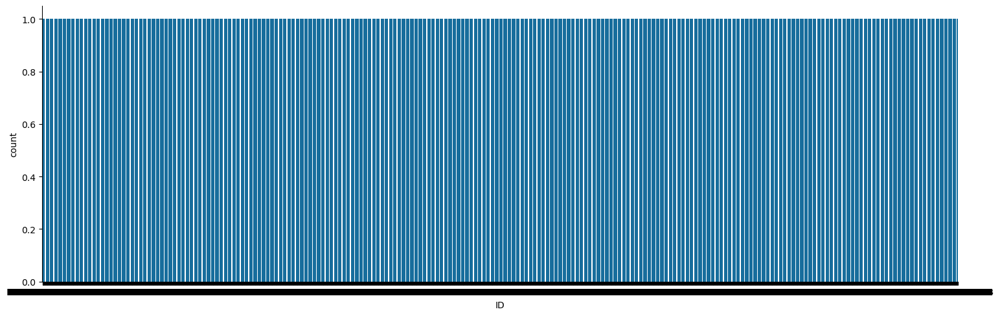

In [87]:
sns.catplot( data = m03_df, x='ID', kind='count', aspect=3 )

plt.show()

`ID` is unique for the cell phone case. The above plot tells us that each row in the dataset represents one unique cell phone case

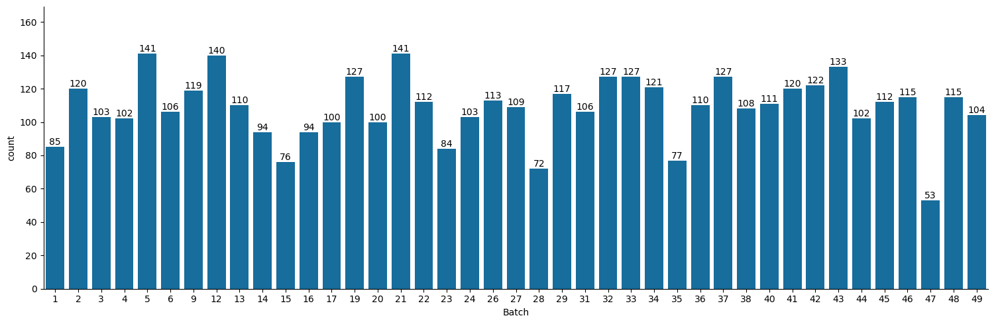

In [88]:
h = sns.catplot(data=m03_df, x='Batch', kind='count', aspect=3)

h.fig.subplots_adjust(top=0.9)

for ax in h.axes.ravel():
    
    # add annotations
    for c in ax.containers:
        labels = [f'{(v.get_height()):.0f}' for v in c]
        ax.bar_label(c, labels=labels, label_type='edge')
    ax.margins(y=0.2)
plt.tight_layout()
plt.show()

Above plot shows number of cell phone cases manufactured per `Batch`

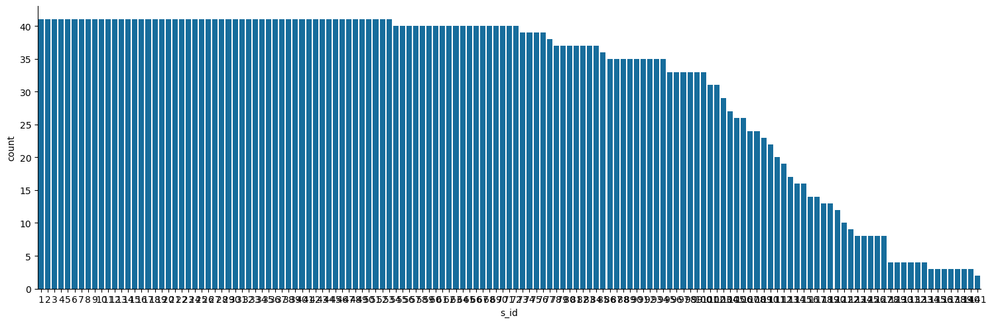

In [89]:
sns.catplot( data = m03_df, x='s_id', kind='count', aspect=3)

`s_id` The sequential production index for a single cell phone case within a Batch on a machine

###### MARGINAL behavior of Continuous Variables

First will create a LONG FORMAT representation of the given machine dataset

In [90]:
df_features = m03_df.select_dtypes('number').copy()
df_objects = m03_df.select_dtypes('object').copy()
id_cols = ['rowid'] + df_objects.columns.to_list()
m03_df_lf = m03_df.reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=id_cols, value_vars=df_features.columns)

In [91]:
m03_df_lf

,rowid,ID,Batch,s_id,variable,value
0,0,B001-M03-S001,1,1,x1,49.317142
1,1,B001-M03-S002,1,2,x1,49.983523
2,2,B001-M03-S003,1,3,x1,48.762702
3,3,B001-M03-S004,1,4,x1,50.009580
4,4,B001-M03-S005,1,5,x1,48.892358
...,...,...,...,...,...,...
17827,4453,B049-M03-S100,49,100,x4,13.753264
17828,4454,B049-M03-S101,49,101,x4,13.636539
17829,4455,B049-M03-S102,49,102,x4,13.678206
17830,4456,B049-M03-S103,49,103,x4,13.880084


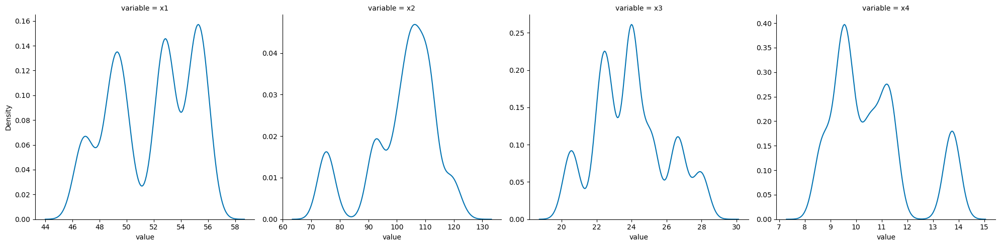

In [92]:
sns.displot(data = m03_df_lf, x='value', col='variable', kind='kde',
            facet_kws={'sharex': False, 'sharey': False},
            common_norm=False)

plt.show()

* x1,x3 symmetrical
* x2 moderate negative skew
* x4 moderate positive skew

**Do the summary statistics of the OPERATING VARIABLES x1 through x4 vary across the Batch values?**

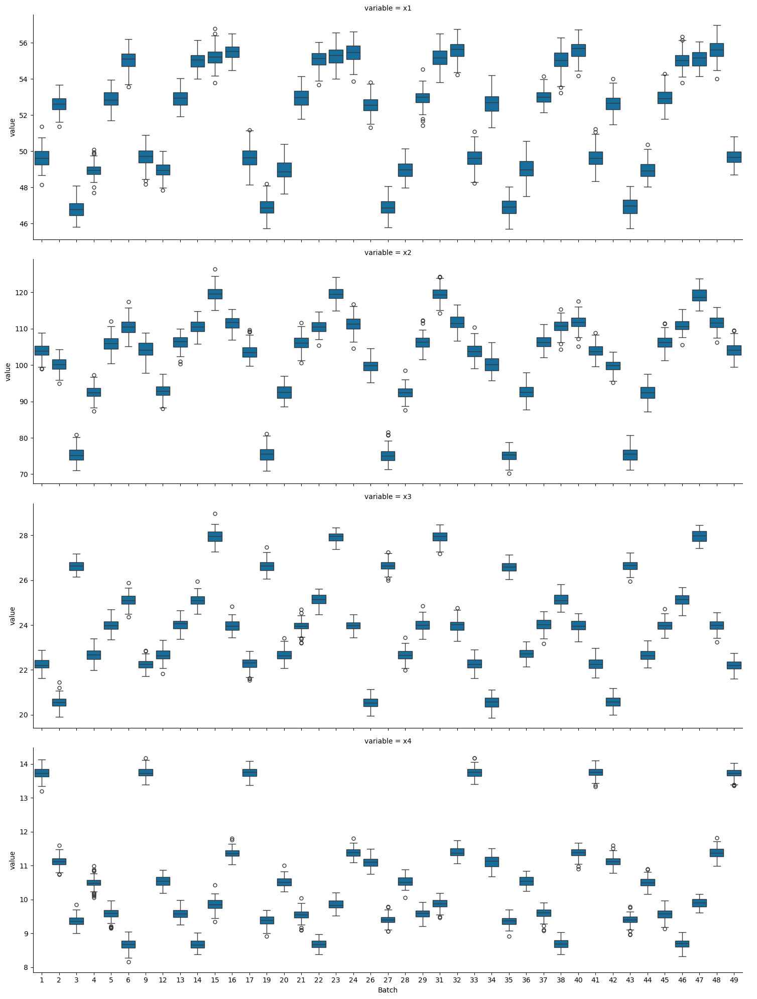

In [93]:
sns.catplot(data = m03_df_lf, x='Batch', y='value', col='variable', col_wrap=1, aspect=3,
            kind='box',
            sharey=False)

plt.show()

Based on the above plot, yes, summary statistics of the OPERATING VARIABLES x1 through x4 vary across the Batch values

**Do the relationships between the OPERATING VARIABLES x1 through x4 vary across the Batch values?**

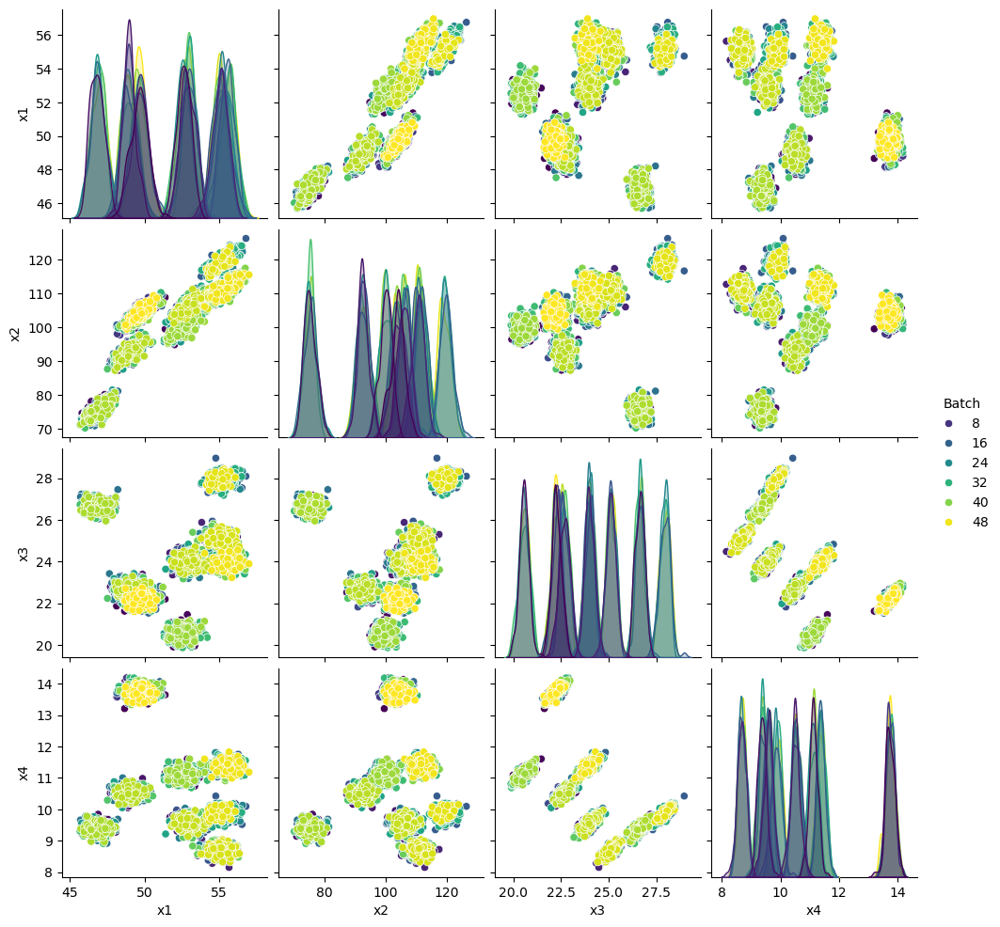

In [94]:
sns.pairplot(data=m03_df[['x1', 'x2', 'x3', 'x4', 'Batch']], 
             hue='Batch',  
             diag_kws={'common_norm': False},
             palette='viridis')

plt.show()

In [103]:
the_groups = m03_df.Batch.unique().tolist()

corr_per_group = m03_df.loc[ :, ['Batch', 'x1', 'x2', 'x3', 'x4']].groupby(['Batch']).corr()

subgroups = [the_groups[i:i + 5] for i in range(0, len(the_groups) - 1, 5)] # Done so that the plot isn't cluttered
subgroups

[[1, 2, 3, 4, 5],
 [6, 9, 12, 13, 14],
 [15, 16, 17, 19, 20],
 [21, 22, 23, 24, 26],
 [27, 28, 29, 31, 32],
 [33, 34, 35, 36, 37],
 [38, 40, 41, 42, 43],
 [44, 45, 46, 47, 48]]

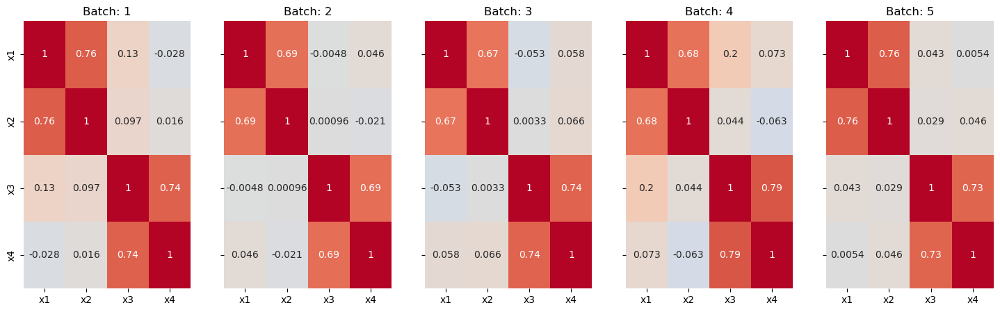

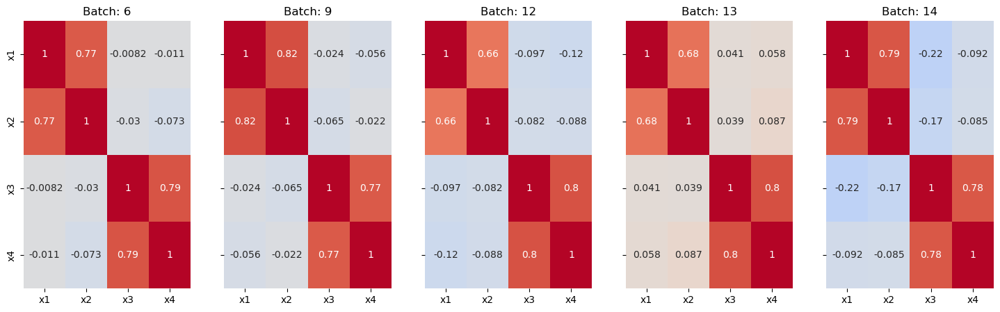

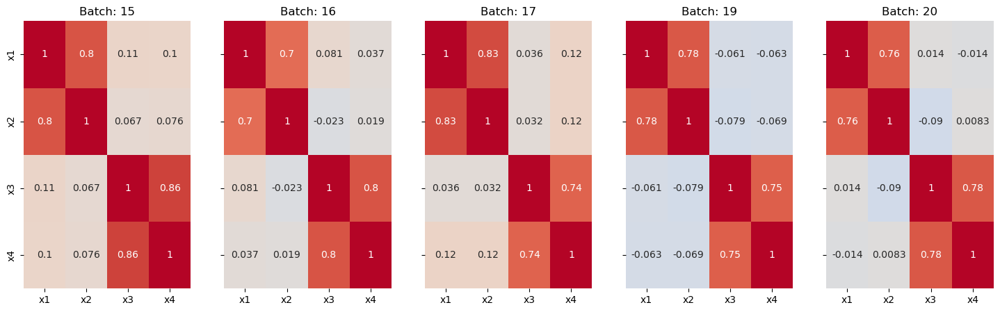

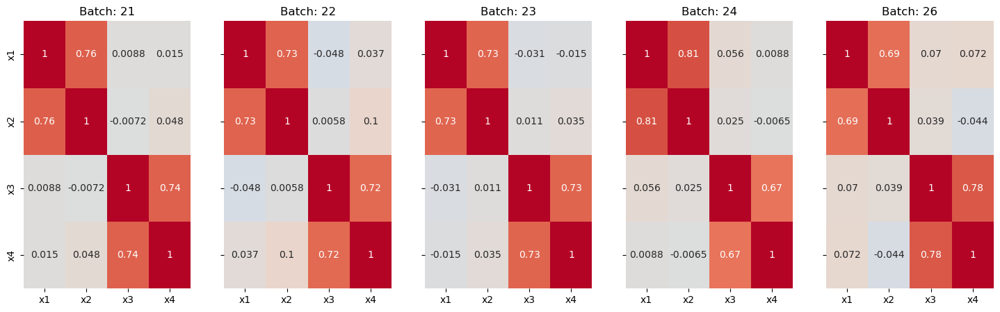

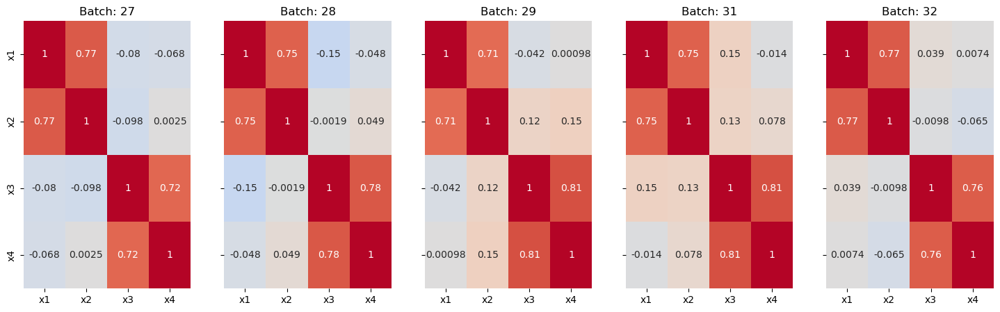

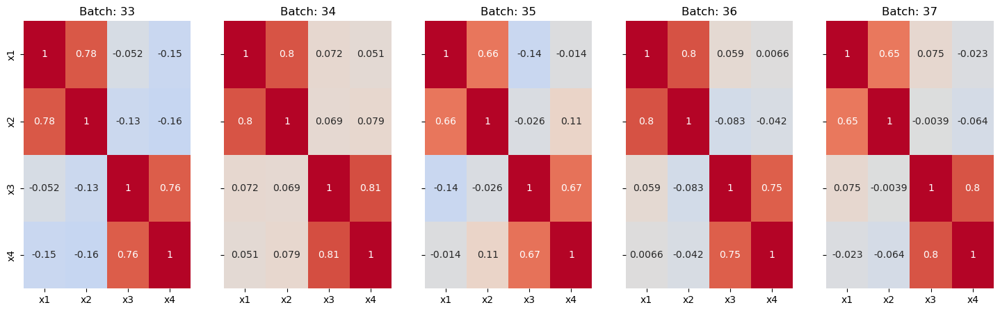

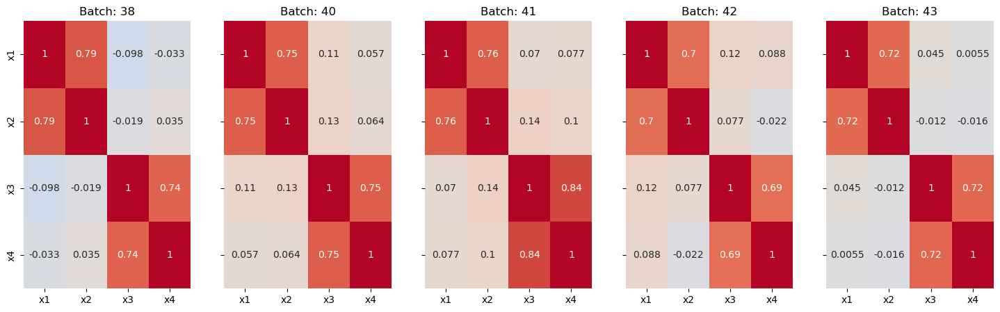

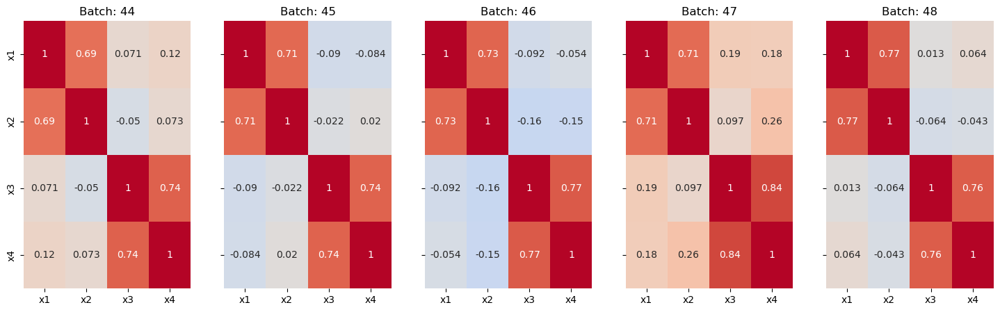

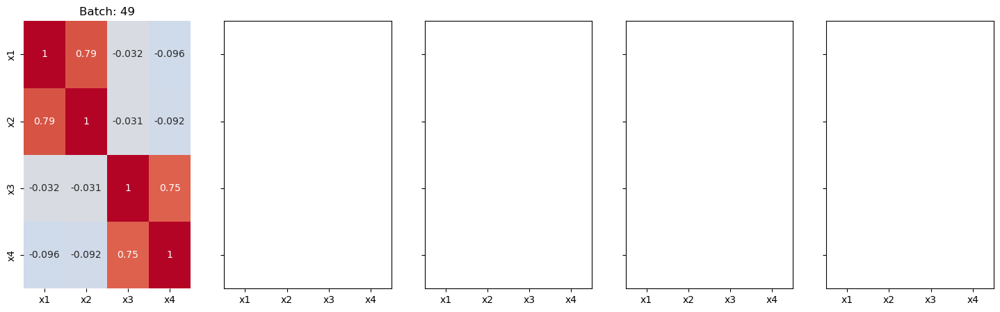

In [106]:
the_groups = m03_df.Batch.unique().tolist()

corr_per_group = m03_df.loc[ :, ['Batch', 'x1', 'x2', 'x3', 'x4']].groupby(['Batch']).corr()

subgroups = [the_groups[i:i + 5] for i in range(0, len(the_groups), 5)] # Done so that the plot isn't cluttered

for sg in subgroups:
    if len(sg) < 5:
        fig, axs = plt.subplots(1, 5, figsize=(18, 5), sharex=True, sharey=True )
    else:
        fig, axs = plt.subplots(1, len(sg), figsize=(18, 5), sharex=True, sharey=True )

    for i in range(len(sg)):
        sns.heatmap( data = corr_per_group.loc[ sg[ i ] ],
                     vmin=-1, vmax=1, center = 0,
                     cmap='coolwarm', cbar=False,
                     annot=True, annot_kws={'size': 10},
                     ax=axs[i] )

        axs[i].set_title('Batch: %s' % sg[ i ] )

    plt.show()

Based on the above pair plot and correlation plot we can confirm that the relationships between the operating variables vary across Batch values

###### **Relationships between machine datasets**

**Relationships between machine datasets**

In [107]:
m01_df['machine_id'] = 1
m02_df['machine_id'] = 2
m03_df['machine_id'] = 3
machine_df = pd.concat([m01_df, m02_df, m03_df])


machine_df['Batch']=machine_df.Batch.astype('object')
machine_df['s_id']=machine_df.s_id.astype('object')
machine_df['ID']=machine_df.ID.astype('object')
machine_df['machine_id']=machine_df.machine_id.astype('object')

machine_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14729 entries, 0 to 4457
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   ID          14729 non-null  object 
 1   Batch       14729 non-null  object 
 2   s_id        14729 non-null  object 
 3   x1          14729 non-null  float64
 4   x2          14729 non-null  float64
 5   x3          14729 non-null  float64
 6   x4          14729 non-null  float64
 7   machine_id  14729 non-null  object 
dtypes: float64(4), object(4)
memory usage: 1.0+ MB


In [108]:
df_features = machine_df.select_dtypes('number').copy()
df_objects = machine_df.select_dtypes('object').copy()
id_cols = ['rowid'] + df_objects.columns.to_list()
machine_df_lf = machine_df.reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=id_cols, value_vars=df_features.columns)

machine_df_lf. head()

,rowid,ID,Batch,s_id,machine_id,variable,value
0,0,B001-M01-S001,1,1,1,x1,50.117118
1,1,B001-M01-S002,1,2,1,x1,46.887333
2,2,B001-M01-S003,1,3,1,x1,50.132744
3,3,B001-M01-S004,1,4,1,x1,48.501042
4,4,B001-M01-S005,1,5,1,x1,49.690442


**How many unique values for `Batch` are associated with each MACHINE (data set)?**

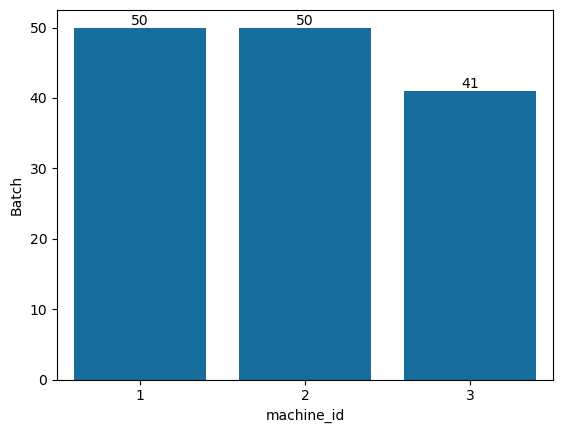

In [109]:
fig, ax = plt.subplots()
ax = sns.barplot(machine_df.groupby('machine_id').Batch.nunique())
ax.bar_label(ax.containers[0], fontsize=10);

There are 50 unique values for `Batch` in machine 1, machine 2 and 41 in the machine 3

**How many cell phone cases are associated with each `Batch` value for each MACHINE (data set)?**

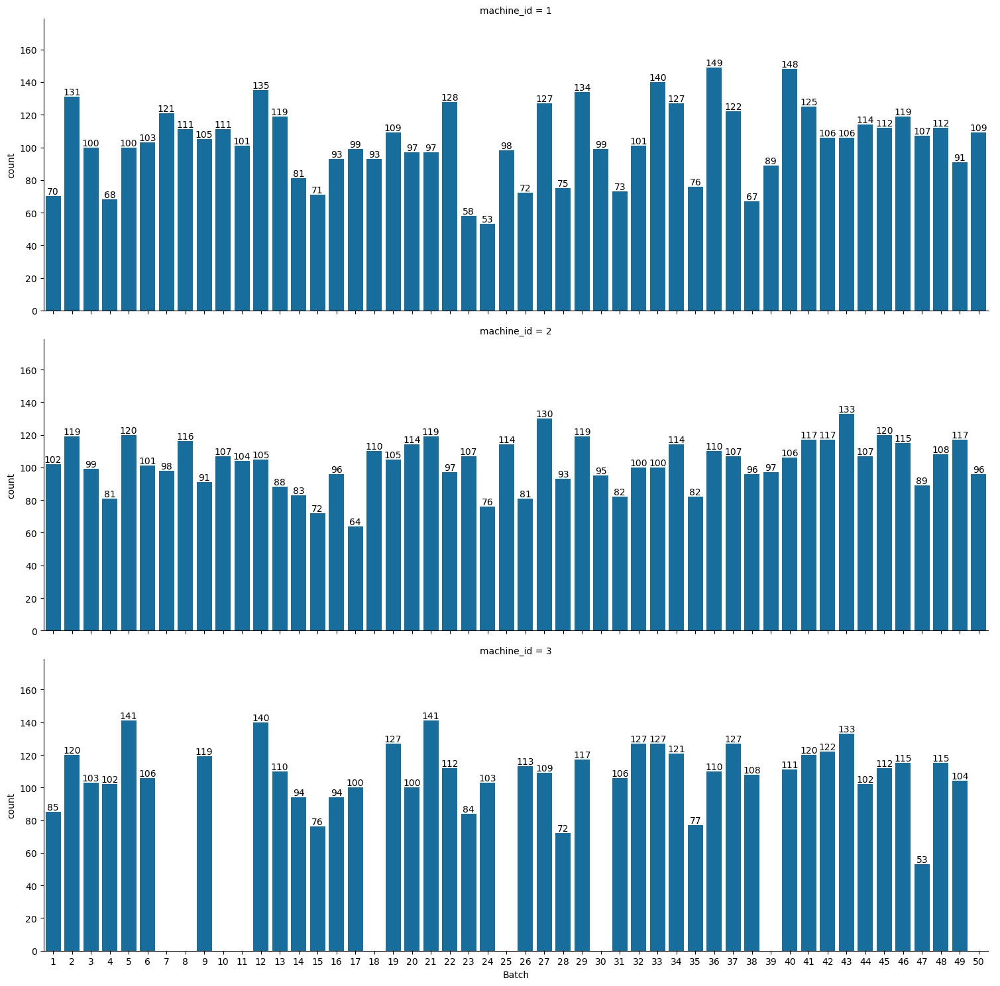

In [110]:
g = sns.catplot(data=machine_df, x='Batch', kind='count', col='machine_id', col_wrap=1, aspect=3,)

g.fig.subplots_adjust(top=0.9)

# iterate through axes
for ax in g.axes.ravel():
    
    # add annotations
    for c in ax.containers:
        labels = [f'{(v.get_height()):.0f}' for v in c]
        ax.bar_label(c, labels=labels, label_type='edge')
    ax.margins(y=0.2)
plt.tight_layout()
plt.show()

**Do the summary statistics of the OPERATING VARIABLES `x1` through `x4` vary across the three MACHINES?**

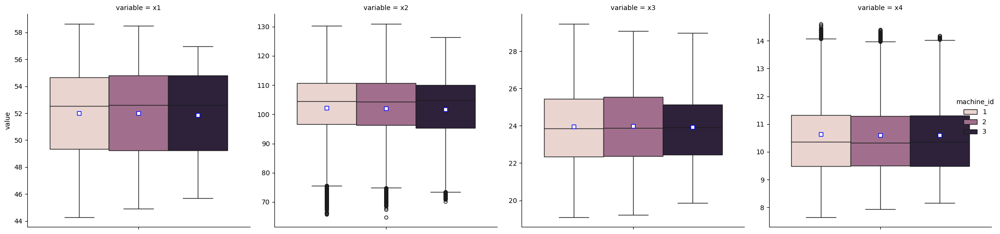

In [116]:
sns.catplot(data = machine_df_lf,  hue='machine_id', col='variable', y='value',
            kind='box', 
            sharey=False, showmeans=True,
            meanprops={"marker":"s","markerfacecolor":"white", "markeredgecolor":"blue"}
           )
# plt.subplots_adjust(hspace=0.5)
plt.tight_layout()
plt.show()

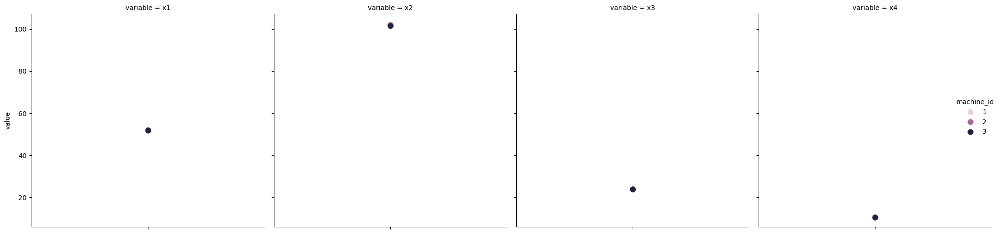

In [133]:
sns.catplot(data = machine_df_lf,  hue='machine_id', col='variable', y='value',
            kind='point', 
            linestyle='none'
           )
# plt.subplots_adjust(hspace=0.5)
plt.tight_layout()
plt.show()

🛎️ The summary statistics of the OPERATING VARIABLES `x1` through `x4` vary among themselves but **DOES NOT VARY across the THREE MACHINES**

**Do the relationships between the OPERATING VARIABLES `x1` through `x4` vary across the three MACHINES?**

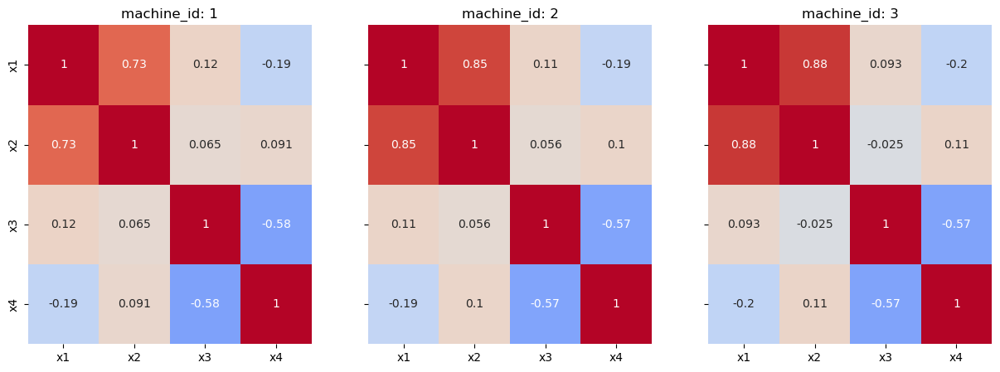

In [123]:
the_groups_machine = machine_df.machine_id.unique().tolist()
corr_per_group_machine = machine_df.loc[ :, ['x1', 'x2', 'x3', 'x4', 'machine_id']].groupby(['machine_id']).corr()

fig, axs = plt.subplots(1, len(the_groups_machine), figsize=(15, 5), sharex=True, sharey=True)

for i in range(len(the_groups_machine)):
    sns.heatmap(data = corr_per_group_machine.loc[the_groups_machine[i]],
                 vmin=-1, vmax=1, center = 0,
                 cmap='coolwarm', cbar=False,
                 annot=True, annot_kws={'size': 10},
                 ax=axs[i])

    axs[i].set_title('machine_id: %s' % the_groups_machine[i] )

plt.show()

**Few observations:**

1. `x1` and `x2` have strong positive correlation across all three machines
2. `x3` and `x4` have moderate negative correlation across all three machine
3. `x1` and `x3` correlation vary across three machine
4. `x1` and `x4` correlation vary across three machine
5. `x2` and `x3` correlation vary across three machine

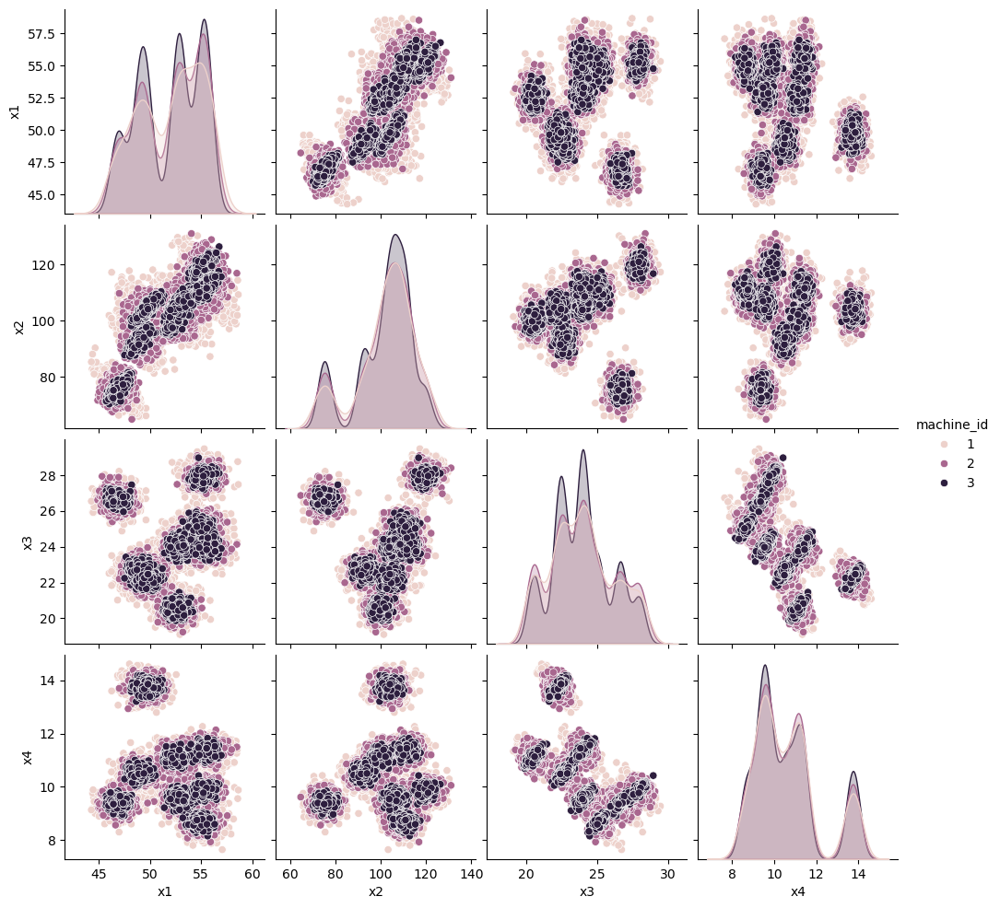

In [136]:
sns.pairplot(data = machine_df[['x1','x2','x3','x4','machine_id']], 
             hue='machine_id', 
             diag_kws={'common_norm': False})

plt.show()

🛎️ Yes, the relationships between the OPERATING VARIABLES `x1` through `x4` **vary across the three MACHINES**

[Go to top](#Shortcuts)

## Problem 02

The supplier batch data set file name is provided for you below. You must read in the CSV file and assign the data set to the `batch_df` object. 

You must perform the following **ESSENTIAL** activities:

* How many rows and columns are in the data? 
* What are the names and data types for each column?
* How many unique values are there for each column?
* How many missing values are there for each column?

You must visually explore the MARGINAL behavior of the variables in the data. You must use visualizations appropriate for the DATA TYPE of the columns.

You must visually explore RELATIONSHIPS between variables in the data. You must use visualizations appropriate for the DATA TYPES. You must make sure that your visualizations can answer the following questions:
* Do the summary statistics for `Density` depend on the `Supplier`?
* Does the average `Density` depend on the `Supplier`?
* How does `Density` relate to `Batch` for each `Supplier`?

After exploring the `batch_df` DataFrame, you **MUST** JOIN/MERGE the `batch_df` DataFrame with the `machine_df` DataFrame. Assign the merged DataFrame to the `dfa` DataFrame.

You can now explore the relationships between the MACHINE OPERATIONAL VARIABLES and the SUPPLIERS! You must use visualizations to explore the following relationships:
* Explore if the summary statistics of the 4 OPERATING VARIABLES `x1` through `x4` vary across `Batch` for each MACHINE given each `Supplier`. Your figures MUST use `Batch` as the x-axis variable.
* Explore if the relationships between the 4 OPERATING VARIABLES `x1` through `x4` vary across `Supplier`.

You may add as many markdown and code cells as you see fit to answer this question.

### SOLUTION

In [139]:
# define the batch supplier file
batch_file = 'midterm_supplier.csv'

In [141]:
# read in the batch supplier data set

batch_df = pd.read_csv(batch_file)
print(f'There are {batch_df.shape[0]} rows and {batch_df.shape[1]} columns')

There are 50 rows and 3 columns


In [142]:
batch_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Batch     50 non-null     int64  
 1   Supplier  50 non-null     object 
 2   Density   50 non-null     float64
dtypes: float64(1), int64(1), object(1)
memory usage: 1.3+ KB


There are three columns

1. `Batch` is a number but as given in the problem statement will convert that to a categorical
2. `Supplier` is a categorical
3. `Density` is a number

In [143]:
batch_df['Batch'] = batch_df['Batch'].astype('object')
batch_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Batch     50 non-null     object 
 1   Supplier  50 non-null     object 
 2   Density   50 non-null     float64
dtypes: float64(1), object(2)
memory usage: 1.3+ KB


In [144]:
batch_df.nunique(dropna=False)

Batch       50
Supplier     2
Density     50
dtype: int64

There are 50 unique values for `Batch` and `Density` and 2 unique values for `Supplier`

In [145]:
batch_df.isna().sum()

Batch       0
Supplier    0
Density     0
dtype: int64

There are no missing values

#### Marginal Behavior

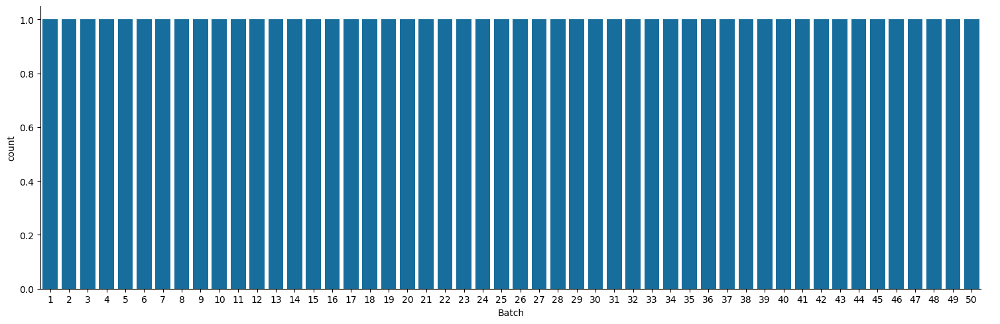

In [146]:
sns.catplot(data=batch_df, x='Batch', kind='count', aspect=3 )
plt.show()

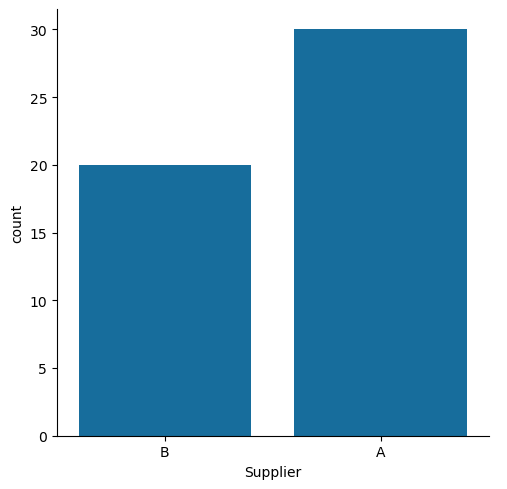

In [147]:
sns.catplot(data=batch_df, x='Supplier', kind='count' )

plt.show()

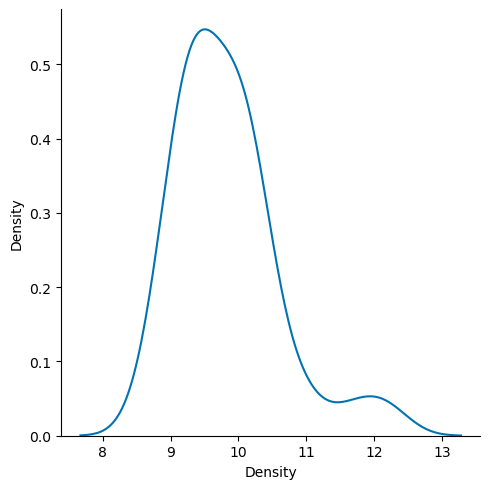

In [149]:
sns.displot(data=batch_df, x='Density', kind='kde')

plt.show()

#### Relationships

**`Density` and `Supplier`**

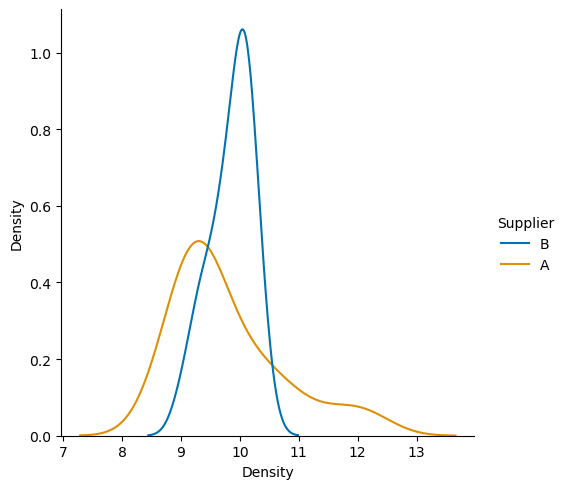

In [150]:
sns.displot(data = batch_df, x='Density', hue='Supplier',
            common_norm=False, kind='kde')

plt.show()

Density has high positive skew (or right skew) for Supplier `A` and  moderate negative skew (or left skew) for Supplier `B`

**Do the summary statistics for `Density` depend on the `Supplier`?**

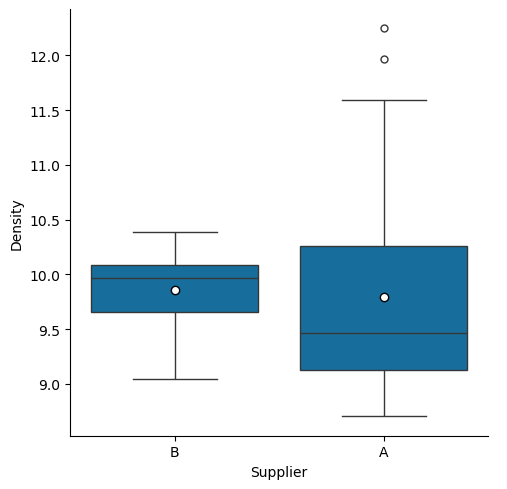

In [154]:
sns.catplot(data = batch_df, x='Supplier', y='Density', kind='box',
            showmeans=True,
            meanprops={'marker': 'o', 'markerfacecolor': 'white', 'markeredgecolor': 'black'})

plt.show()

🛎️ Yes, the SUMMARY STATISTICS of `Density` depends on the `Supplier` and the average `Density` depends on the `Supplier`

**Does the average `Density` depend on the `Supplier`?**

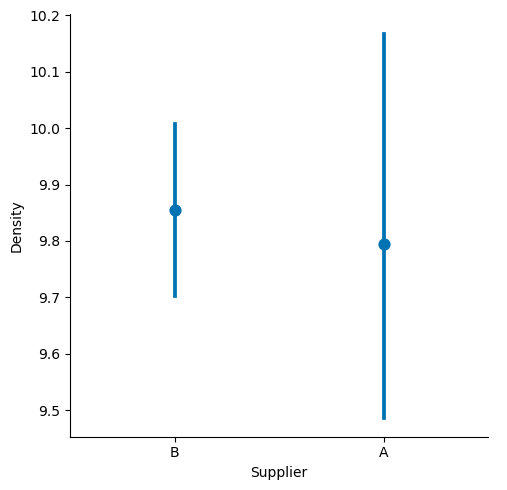

In [155]:
sns.catplot(data = batch_df, x='Supplier', y='Density', kind='point', linestyle='none')

plt.show()

**How does `Density` relate to `Batch` for each `Supplier`?**

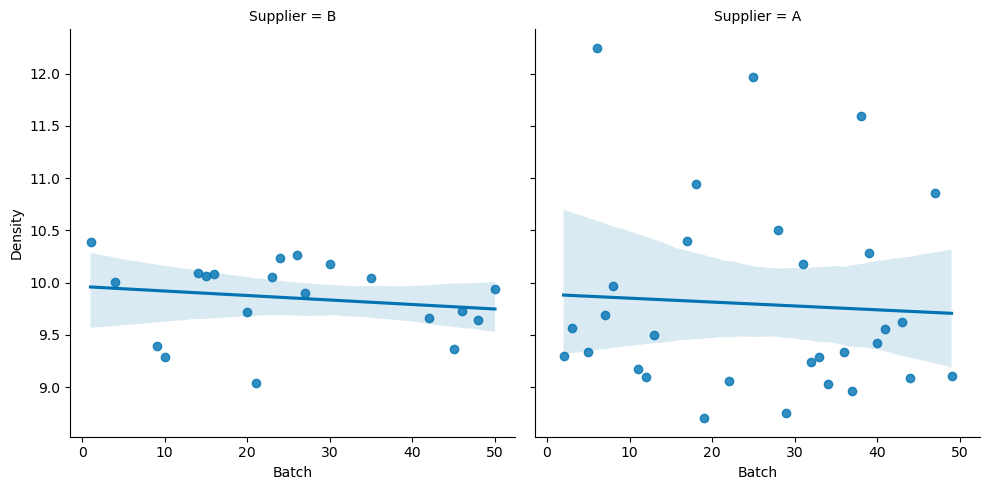

In [157]:
batch_df['Batch'] = batch_df.Batch.astype('int64') # converting batch to int64 for trend plot

sns.lmplot(data=batch_df, x='Batch', y='Density', col='Supplier')

plt.show()

**Observation:** Since the TREND LINE is not very steep we cannot establish a clear relationship between `Batch` and `Density` across unique values `Supplier`

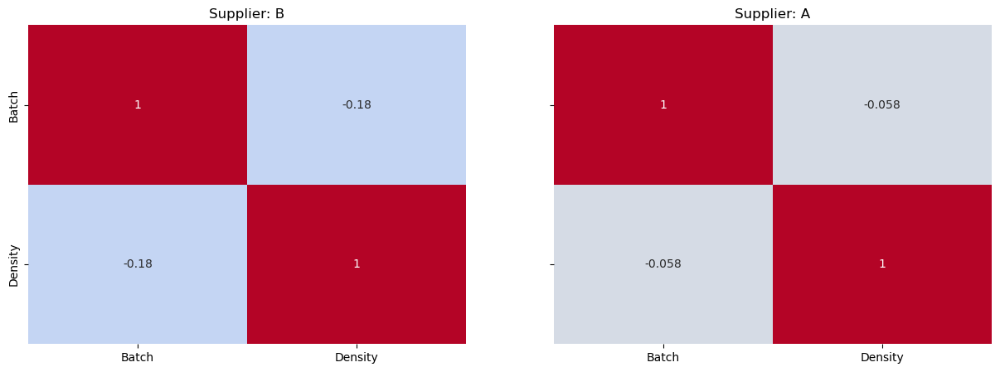

In [164]:
the_groups_Supplier = batch_df.Supplier.unique().tolist()
correlation_per_Supplier = batch_df.loc[ :, ['Batch', 'Density', 'Supplier']].groupby(['Supplier']).corr()

fig, axs = plt.subplots(1, len(the_groups_Supplier), figsize=(15, 5), sharex=True, sharey=True)

for i in range(len(the_groups_Supplier)):
    sns.heatmap(data = correlation_per_Supplier.loc[the_groups_Supplier[i]],
                 vmin=-1, vmax=1, center = 0,
                 cmap='coolwarm', cbar=False,
                 annot=True, annot_kws={'size': 10},
                 ax=axs[i])

    axs[i].set_title('Supplier: %s' % the_groups_Supplier[i] )

plt.show()

**Observation:** Negligible correlation. So, no clear relationship can be established

In [ ]:
🛎️ No clear relationship can be established

#### Merge the batch supplier data set with the (concatenated) machine data set

In [173]:
# merge the batch supplier data set with the (concatenated) machine data set

dfa = pd.merge( batch_df, machine_df, on='Batch' )
dfa

,Batch,Supplier,Density,ID,s_id,x1,x2,x3,x4,machine_id
0,1,B,10.388587,B001-M01-S001,1,50.117118,102.167346,22.067812,13.889524,1
1,1,B,10.388587,B001-M01-S002,2,46.887333,112.266102,23.197330,13.064709,1
2,1,B,10.388587,B001-M01-S003,3,50.132744,103.674908,22.319933,13.647482,1
3,1,B,10.388587,B001-M01-S004,4,48.501042,107.143156,22.162947,14.077758,1
4,1,B,10.388587,B001-M01-S005,5,49.690442,102.120283,22.248696,13.728666,1
...,...,...,...,...,...,...,...,...,...,...
14724,50,B,9.935676,B050-M02-S092,92,52.690936,95.050804,20.324674,10.963370,2
14725,50,B,9.935676,B050-M02-S093,93,52.348015,97.863144,20.884779,11.156604,2
14726,50,B,9.935676,B050-M02-S094,94,52.187241,99.887013,20.439142,11.303222,2
14727,50,B,9.935676,B050-M02-S095,95,52.875621,101.572057,20.648029,11.084512,2


In [167]:
dfa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14729 entries, 0 to 14728
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Batch       14729 non-null  object 
 1   Supplier    14729 non-null  object 
 2   Density     14729 non-null  float64
 3   ID          14729 non-null  object 
 4   s_id        14729 non-null  object 
 5   x1          14729 non-null  float64
 6   x2          14729 non-null  float64
 7   x3          14729 non-null  float64
 8   x4          14729 non-null  float64
 9   machine_id  14729 non-null  object 
dtypes: float64(5), object(5)
memory usage: 1.1+ MB


In [169]:
dfa['Density'] = dfa.Density.astype('object')

In [172]:
dfa_features = dfa.select_dtypes('number').copy()
dfa_objects = dfa.select_dtypes('object').copy()
id_cols = ['rowid'] + dfa_objects.columns.to_list()
dfa_lf = dfa.reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=id_cols, value_vars=df_features.columns)

dfa_lf

,rowid,Batch,Supplier,Density,ID,s_id,machine_id,variable,value
0,0,1,B,10.388587,B001-M01-S001,1,1,x1,50.117118
1,1,1,B,10.388587,B001-M01-S002,2,1,x1,46.887333
2,2,1,B,10.388587,B001-M01-S003,3,1,x1,50.132744
3,3,1,B,10.388587,B001-M01-S004,4,1,x1,48.501042
4,4,1,B,10.388587,B001-M01-S005,5,1,x1,49.690442
...,...,...,...,...,...,...,...,...,...
58911,14724,50,B,9.935676,B050-M02-S092,92,2,x4,10.963370
58912,14725,50,B,9.935676,B050-M02-S093,93,2,x4,11.156604
58913,14726,50,B,9.935676,B050-M02-S094,94,2,x4,11.303222
58914,14727,50,B,9.935676,B050-M02-S095,95,2,x4,11.084512


**Explore if the summary statistics of the 4 OPERATING VARIABLES x1 through x4 vary across Batch for each MACHINE given each Supplier. Your figures MUST use Batch as the x-axis variable.**

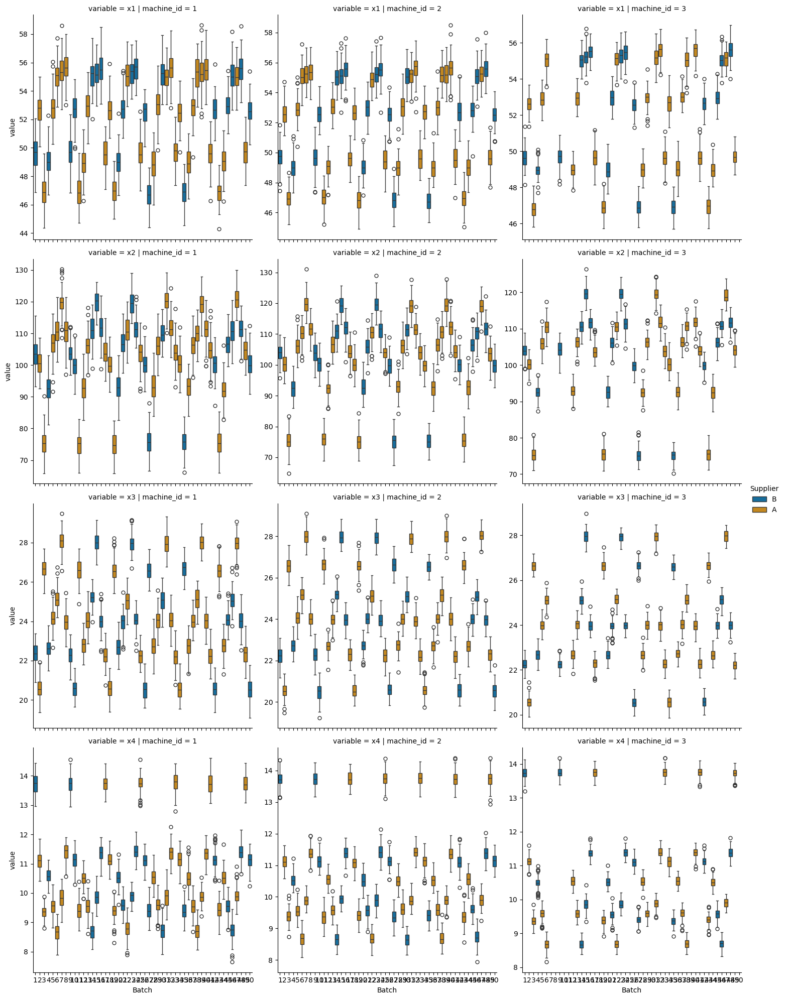

In [179]:
sns.catplot(data = dfa_lf, x='Batch', y='value', col='machine_id',
            row='variable', hue='Supplier',
            kind='box',
            sharey=False)

plt.show()

🛎️ Given a `Supplier` the summary statistics of OPERATING VARIABLE `x1` through `x4` **vary across** `Batch` for each `MACHINE`

**Explore if the relationships between the 4 OPERATING VARIABLES x1 through x4 vary across Supplier.**

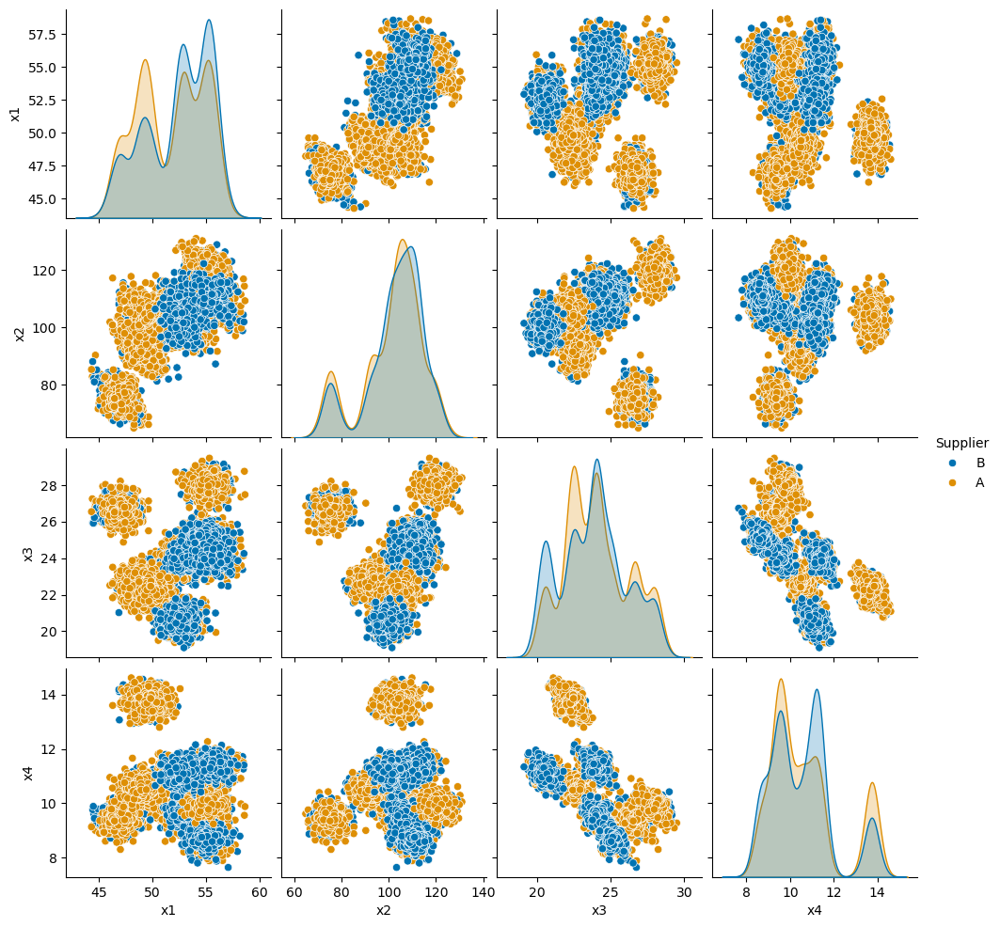

In [180]:
sns.pairplot(data=dfa[['Supplier', 'x1', 'x2', 'x3', 'x4']],
             hue='Supplier',
             diag_kws={'common_norm': False})

plt.show()

**Observation:** Primarily for `Supplier` A - Higher values of `x4` tend to have unique relationships with other three variables

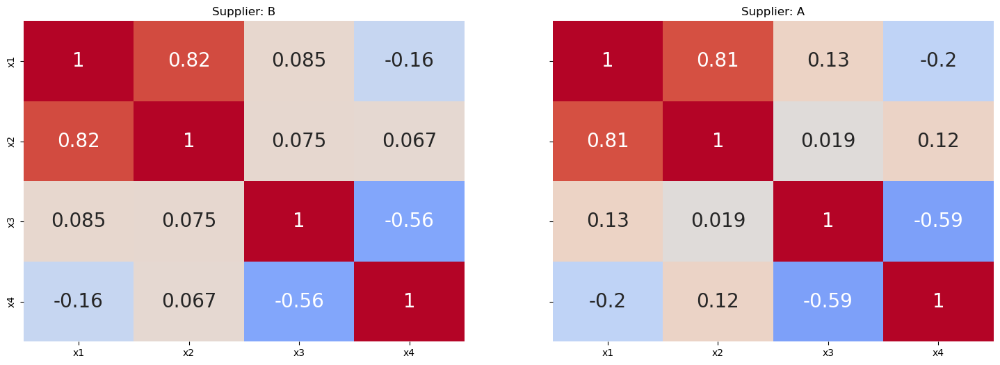

In [181]:
the_groups = dfa.Supplier.unique().tolist()


corr_per_group = dfa.loc[ :, ['Supplier', 'x1', 'x2', 'x3', 'x4']].groupby(['Supplier']).corr()

fig, axs = plt.subplots(1, len(the_groups), figsize=(18, 6), sharex=True, sharey=True )

for ix in range(len(the_groups)):
    sns.heatmap( data = corr_per_group.loc[ the_groups[ ix ] ],
                 vmin=-1, vmax=1, center = 0,
                 cmap='coolwarm', cbar=False,
                 annot=True, annot_kws={'size': 20},
                 ax=axs[ix] )
    
    axs[ ix ].set_title('Supplier: %s' % the_groups[ ix ] )

plt.show()

**Observations:**

Following relationship is seen across both `Supplier`s

1. `x1` and `x2` are highly correlated
2. `x3` and `x4` are moderately correlated

🛎️ Based on the above plots, yes, the relationships between the 4 OPERATING VARIABLES x1 through x4 varies across Supplier.

[Go to top](#Shortcuts)

## Problem 03

The DROP TEST result data set file name is provided for you below. You must read in the CSV file and assign the dta set to the `test_df` object. 

You must perform the following **ESSENTIAL** activities:

* How many rows and columns are in the data? 
* What are the names and data types for each column?
* How many unique values are there for each column?
* How many missing values are there for each column?

You must visually explore the MARGINAL behavior of the variables in the data. You must use visualizations appropriate for the DATA TYPE of the columns.

You must visually explore RELATIONSHIPS between variables in the data. You must use visualizations appropriate for the DATA TYPES. You must make sure that your visualizations can answer the following questions:
* Count the number of times each unique value of `Result` occurs for each `test_group_id` value.

After exploring the `test_df` DataFrame, you **MUST** JOIN/MERGE the `test_df` DataFrame with the `dfa` DataFrame. Assign the merged DataFrame to the `dfb` DataFrame. You **MUST** answer the following:
* How many rows remain using the DEFAULT joining procedure?

You may add as many markdown and code cells as you see fit to answer this question. 

### SOLUTION

In [183]:
# define the test data set file name
test_file = 'midterm_test.csv'

In [184]:
# read in the test data set

test_df = pd.read_csv(test_file)

#### Essential Data Analysis

In [186]:
print(f'There are {test_df.shape[0]} rows and {test_df.shape[1]} columns')

There are 1412 rows and 3 columns


In [187]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   ID             1412 non-null   object
 1   test_group_id  1412 non-null   object
 2   Result         1412 non-null   int64 
dtypes: int64(1), object(2)
memory usage: 33.2+ KB


In [188]:
test_df.nunique()

ID               1412
test_group_id     141
Result              2
dtype: int64

There are 1412 unique values for `ID`, 141 unique values for `test_group_id` and 2 unique values for `Result`

In [193]:
test_df.isna().sum()

ID               0
test_group_id    0
Result           0
dtype: int64

No missing values

#### MARGINAL behavior

In [191]:
test_df.describe()

,Result
count,1412.000000
mean,0.301700
std,0.459158
min,0.000000
25%,0.000000
50%,0.000000
75%,1.000000
max,1.000000


In [194]:
test_df.describe(include='object')

,ID,test_group_id
count,1412,1412
unique,1412,141
top,B001-M01-S056,L-4
freq,1,14


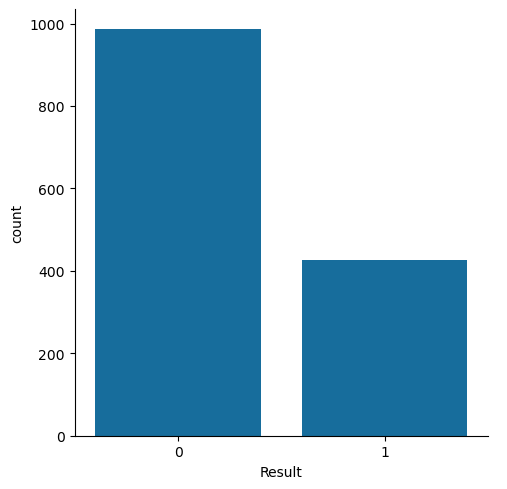

In [195]:
sns.catplot(data=test_df,
            x='Result',
            kind='count')

plt.show()

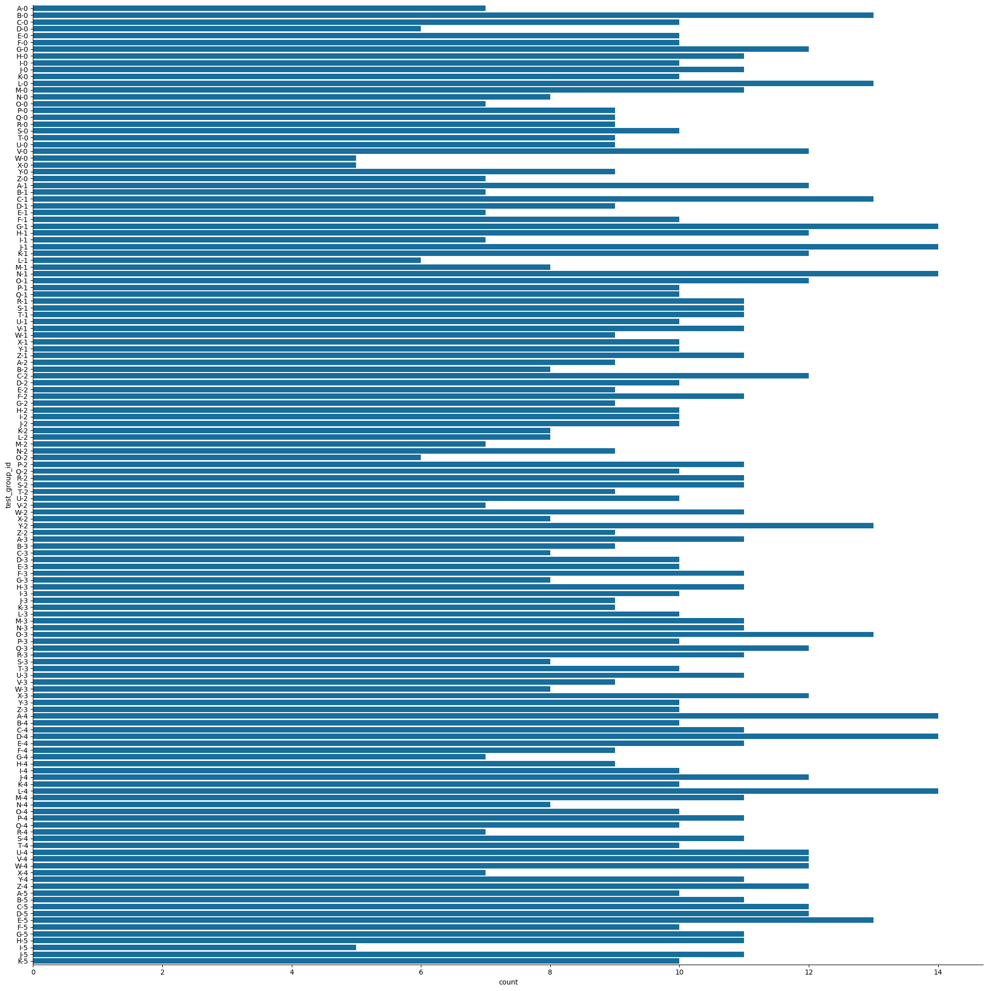

In [197]:
sns.catplot(data=test_df,
            y='test_group_id',
            kind='count',
            height=20)

plt.show()

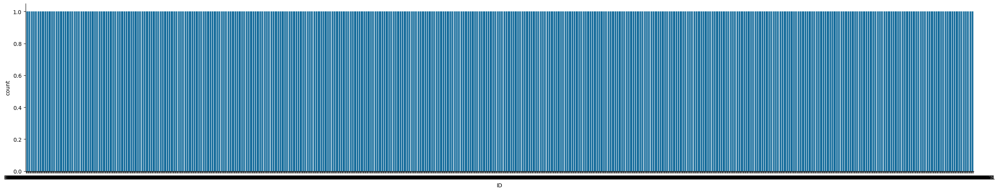

In [196]:
sns.catplot(data=test_df,
            x='ID',
            kind='count',
            aspect=5)

plt.show()

#### Relationships

**Count the number of times each unique value of `Result` occurs for each `test_group_id` value.**

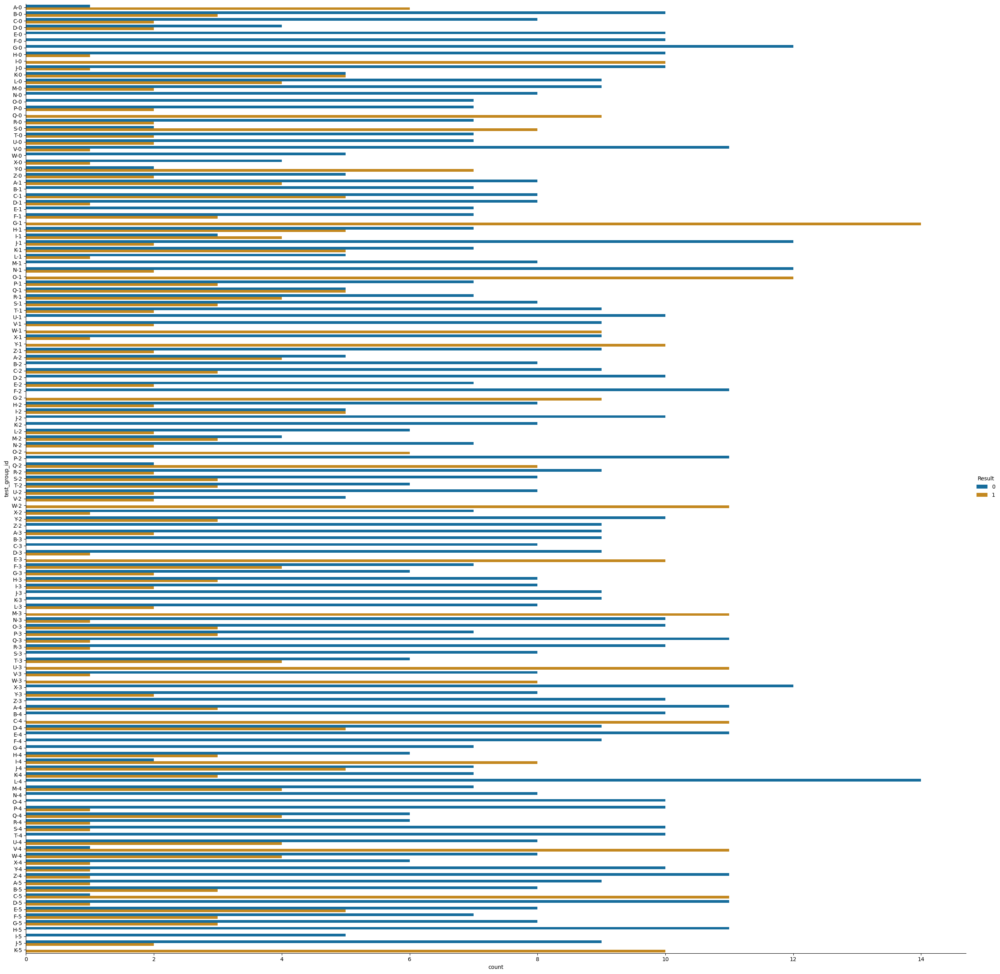

In [200]:
sns.catplot(data = test_df, y='test_group_id', hue='Result', height=25, kind='count')

plt.show()

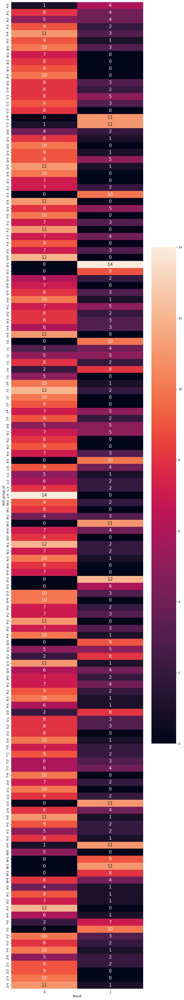

In [209]:
fig, ax = plt.subplots(figsize=(10, 60))

sns.heatmap( pd.crosstab( test_df.test_group_id, test_df.Result ), ax = ax,
             annot=True, annot_kws={'size': 15}, fmt='d')

plt.show()

🛎️ Above plots show the count of number of times each unique value of `Result` occurs for each `test_group_id`. Visualizing a crosstab using heatmap provides better visualizes for these scenarios

In [210]:
# merge test_df with the dfa object

dfb = pd.merge( test_df, dfa, on='ID' )
dfb

,ID,test_group_id,Result,Batch,Supplier,Density,s_id,x1,x2,x3,x4,machine_id
0,B001-M01-S056,A-0,1,1,B,10.388587,56,49.215485,105.647327,21.410531,14.154576,1
1,B001-M01-S002,A-0,1,1,B,10.388587,2,46.887333,112.266102,23.197330,13.064709,1
2,B001-M01-S049,A-0,1,1,B,10.388587,49,49.125629,112.323042,22.874947,13.743788,1
3,B001-M01-S030,A-0,0,1,B,10.388587,30,48.306819,109.445722,22.910858,13.839830,1
4,B001-M01-S048,A-0,1,1,B,10.388587,48,50.564504,109.184587,22.083064,13.954942,1
...,...,...,...,...,...,...,...,...,...,...,...,...
1407,B049-M03-S026,K-5,1,49,A,9.111256,26,49.464765,102.967447,22.411845,13.919089,3
1408,B049-M03-S008,K-5,1,49,A,9.111256,8,49.408191,103.516814,21.966617,13.730119,3
1409,B049-M03-S041,K-5,1,49,A,9.111256,41,49.605196,103.460366,21.932429,13.790280,3
1410,B049-M03-S061,K-5,1,49,A,9.111256,61,49.716703,104.346466,22.059022,13.543388,3


In [217]:
dfb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   ID             1412 non-null   object 
 1   test_group_id  1412 non-null   object 
 2   Result         1412 non-null   int64  
 3   Batch          1412 non-null   object 
 4   Supplier       1412 non-null   object 
 5   Density        1412 non-null   float64
 6   s_id           1412 non-null   object 
 7   x1             1412 non-null   float64
 8   x2             1412 non-null   float64
 9   x3             1412 non-null   float64
 10  x4             1412 non-null   float64
 11  machine_id     1412 non-null   object 
dtypes: float64(5), int64(1), object(6)
memory usage: 132.5+ KB


In [216]:
dfb.shape

(1412, 12)

🛎️ After joining 1412 remain

[Go to top](#Shortcuts)

## Problem 04

You must now examine the merged `dfb` object and answer the following:

* Count the number of times each unique value of `Result` occurs for each value of `machine_id`.
* Count the number of times each unique value of `Result` occurs for each value of `Supplier`.
* Visualize the number of times each unique value of `Result` occurs per `Batch` for each value of `machine_id`.
* Visualize the number of times each unique value of `Result` occurs per `Batch` for each value of `machine_id` and `Supplier`.
* Calculate the PROPORTION of times the cell phone case failed the test in each `Batch` per `machine_id`.
* Visualize the PROPORTION of times the cell phone case failed the test in each `Batch` per `machine_id` and for each unique value of `Supplier`.

*HINT*: Remember that a FAILED test is encoded as `Result == 1`. How can you calculate the PROPORTION of times `Result == 1`?

Add as many cells as you see fit to answer this question.

### SOLUTION

**Count the number of times each unique value of `Result` occurs for each value of `machine_id`.**

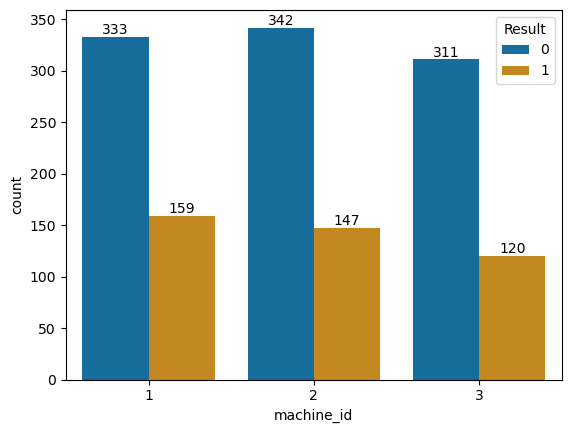

In [222]:
ax = sns.countplot(x='machine_id', hue='Result', data=dfb)
for container in ax.containers:
    ax.bar_label(container)

**Count the number of times each unique value of `Result` occurs for each value of `Supplier`.**

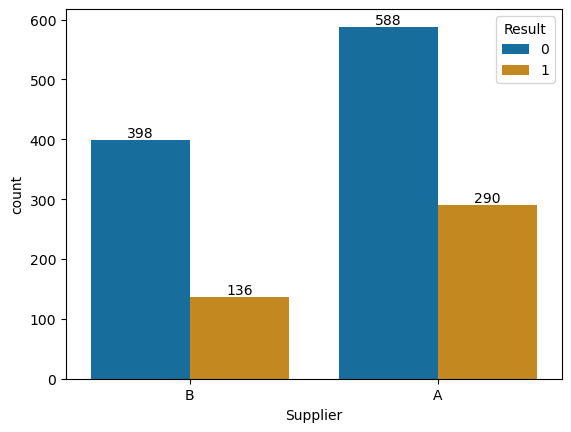

In [220]:
ax = sns.countplot(x='Supplier', hue='Result', data=dfb)
for container in ax.containers:
    ax.bar_label(container)

**Visualize the number of times each unique value of `Result` occurs per `Batch` for each value of `machine_id`.**

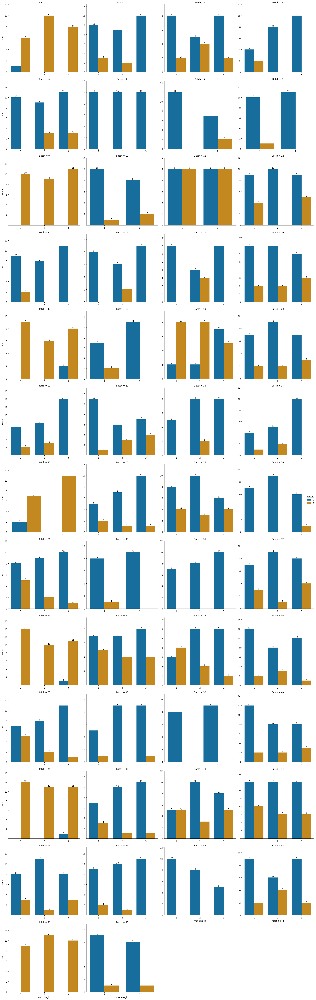

In [224]:
g = sns.catplot(data=dfb, x='machine_id', hue='Result', col='Batch', kind='count', col_wrap=4, sharex=False, sharey=False)

g.fig.subplots_adjust(top=0.9)

for ax in g.axes.ravel():
    
    # add annotationsl
    for c in ax.containers:
        labels = [f'{(v.get_height()):.0f}' for v in c]
        ax.bar_label(c, labels=labels, label_type='edge')
    ax.margins(y=0.2)
plt.tight_layout()
plt.show()

In [232]:
# print(dfb.groupby(['machine_id', 'Batch']).Result.value_counts().to_string())

**Visualize the number of times each unique value of `Result` occurs per `Batch` for each value of `machine_id` and `Supplier`**

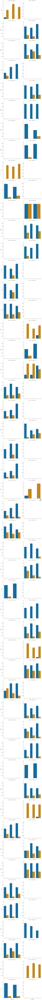

In [233]:
g = sns.catplot(data=dfb, x='machine_id', hue='Result', 
                col='Supplier', row='Batch', 
                kind='count', 
                sharex=False, 
                sharey=False)

g.fig.subplots_adjust(top=0.9)

for ax in g.axes.ravel():
    
    # add annotations
    for c in ax.containers:
        labels = [f'{(v.get_height()):.0f}' for v in c]
        ax.bar_label(c, labels=labels, label_type='edge')
    ax.margins(y=0.2)
plt.tight_layout()
plt.show()

**Calculate the PROPORTION of times the cell phone case failed the test in each `Batch` per `machine_id`**

In [234]:
failure_proportion = (dfb.groupby(['Batch', 'machine_id'])['Result']\
                      .value_counts(normalize=True)\
                      .unstack(fill_value=0)[1]\
                      .reset_index(name='failure_proportion')
                     )
failure_proportion

,Batch,machine_id,failure_proportion
0,1,1,0.857143
1,1,2,1.000000
2,1,3,1.000000
3,2,1,0.230769
4,2,2,0.181818
...,...,...,...
136,49,1,1.000000
137,49,2,1.000000
138,49,3,1.000000
139,50,1,0.100000


**Visualize the PROPORTION of times the cell phone case failed the test in each `Batch` per `machine_id` and for each unique value of `Supplier`**

In [235]:
failure_proportion_supplier = (dfb.groupby(['Batch', 'machine_id', 'Supplier'])['Result']\
                               .value_counts(normalize=True)\
                               .unstack(fill_value=0)[1]\
                               .reset_index(name='failure_proportion_supplier')
                              )
failure_proportion_supplier.sort_values(['Batch', 'machine_id', 'Supplier'], inplace=True)

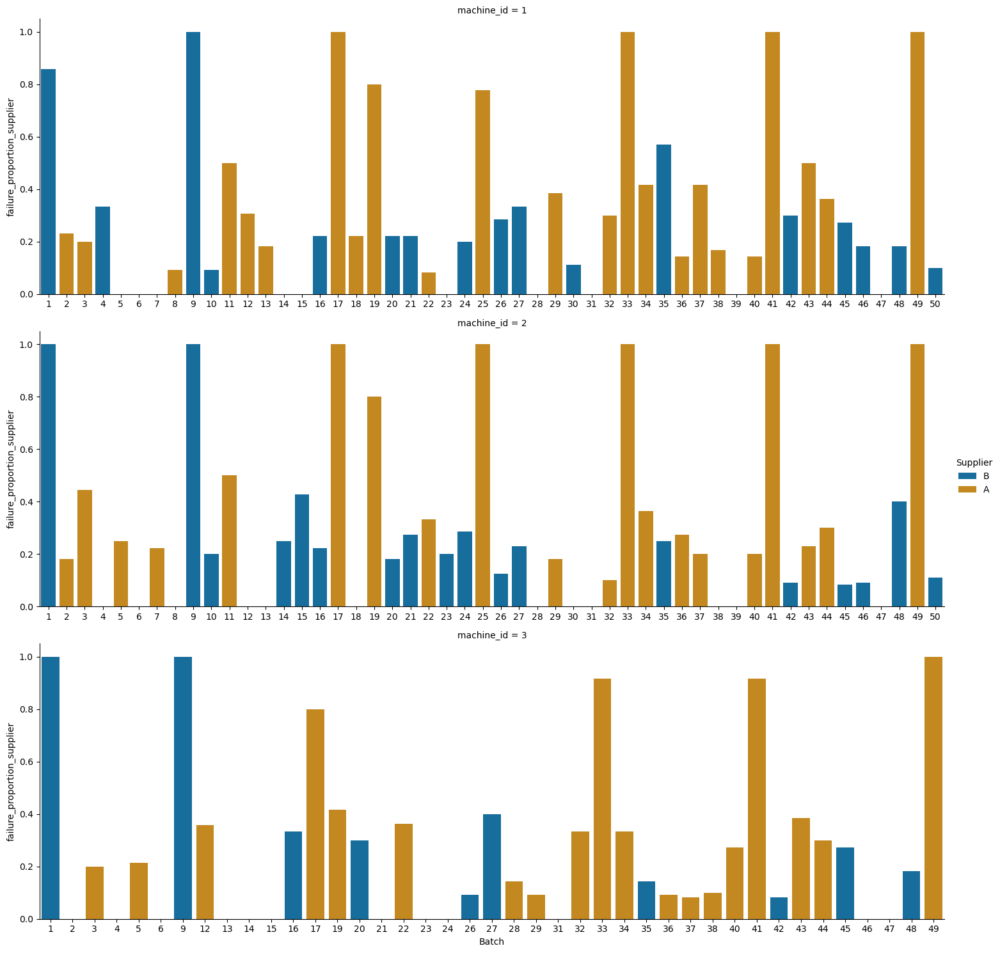

In [237]:
g = sns.catplot(data=failure_proportion_supplier, 
                x='Batch', y='failure_proportion_supplier', 
                hue='Supplier', row='machine_id', 
                kind='bar',
                aspect=3,
                sharex=False, 
                sharey=False,)


## Problem 05

You must cluster the rows of `dfb` using the 4 operational variables `x1` through `x4`. You must decide how many clusters to use and describe how you made that choice. You may use KMeans OR Hierarchical clustering. Include any figures that helped you make that choice.

Visualize your cluster analysis results by:
* Plotting the number of observations per cluster.
* Visualizing the relationships between the operational variables GIVEN the cluster.

You are interested in the PROPORTION of cell phone cases that failed the DROP TEST. Are any of the clusters associated with higher failure PROPORTIONS than others? Based on your visualizations how would you describe that cluster?

Add as many cells as you see fit to answer this question.

### SOLUTION

In [260]:
columns_to_use = ['x1', 'x2', 'x3', 'x4', 'Result']
df_clean = dfb[columns_to_use]
df_clean

,x1,x2,x3,x4,Result
0,49.215485,105.647327,21.410531,14.154576,1
1,46.887333,112.266102,23.197330,13.064709,1
2,49.125629,112.323042,22.874947,13.743788,1
3,48.306819,109.445722,22.910858,13.839830,0
4,50.564504,109.184587,22.083064,13.954942,1
...,...,...,...,...,...
1407,49.464765,102.967447,22.411845,13.919089,1
1408,49.408191,103.516814,21.966617,13.730119,1
1409,49.605196,103.460366,21.932429,13.790280,1
1410,49.716703,104.346466,22.059022,13.543388,1


#### Preprocessing

In [244]:
df_clean.isna().sum()

x1        0
x2        0
x3        0
x4        0
Result    0
dtype: int64

🛎️ There are no MISSING VALUES in the dataset

In [270]:
df_clean_copy = df_clean.copy()

In [271]:
df_clean_copy['Result'] = df_clean.Result.astype('object')

In [272]:
df_clean_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   x1      1412 non-null   float64
 1   x2      1412 non-null   float64
 2   x3      1412 non-null   float64
 3   x4      1412 non-null   float64
 4   Result  1412 non-null   object 
dtypes: float64(4), object(1)
memory usage: 55.3+ KB


In [273]:
df_features_clean = df_clean_copy.select_dtypes('number').copy()

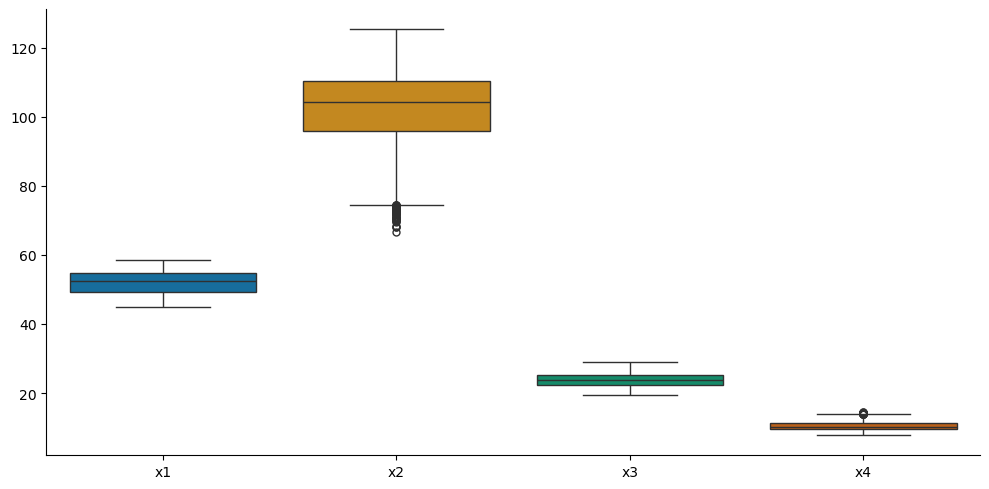

In [274]:
sns.catplot(data = df_features_clean, kind='box', aspect=2)

plt.show()

💡 Since one variable is dominant the data has to be standardized first remove the MAGNITUDE and SCALE effect. KMeans considers SIMILAR to be based on DISTANCE. Distance depends on MAGNITUDE and SCALE

In [275]:
# Using sklearn StandardScaler to standardize the dataset

X = StandardScaler().fit_transform(df_features_clean)

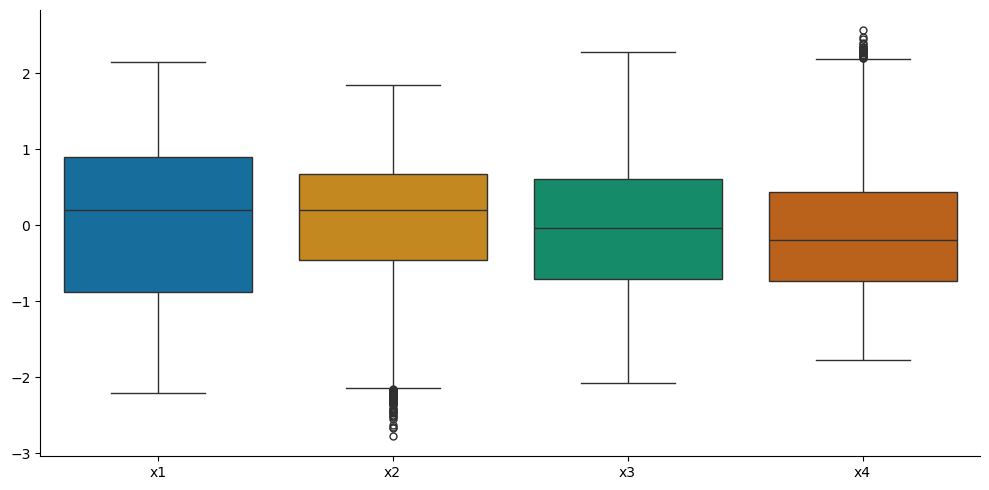

In [276]:
sns.catplot(data = pd.DataFrame(X, columns=df_features_clean.columns), kind='box', aspect=2)

plt.show()

#### Clustering

##### Starting with two clusters

In [277]:
clusters_2 = KMeans(n_clusters=2, random_state=121, n_init=25, max_iter=500).fit_predict(X)

In [278]:
df_clean_copy['k2'] = pd.Series(clusters_2, index=df_clean_copy.index ).astype('category')

In [279]:
df_clean_copy.k2.value_counts()

k2
1    746
0    666
Name: count, dtype: int64

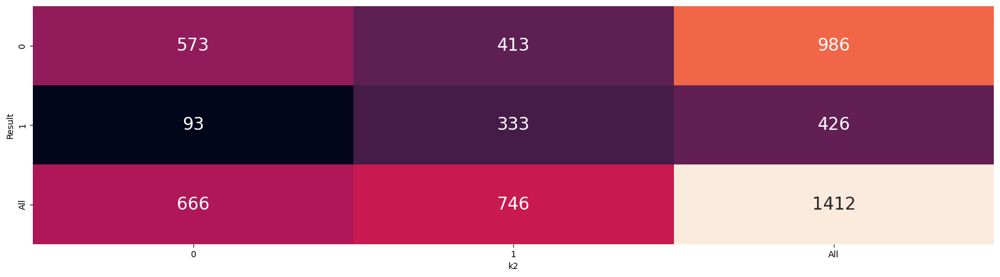

In [280]:
fig, ax = plt.subplots(figsize=(20,5))

sns.heatmap(data = pd.crosstab(df_clean_copy.Result,
                               df_clean_copy.k2,
                               margins=True ),
            annot=True,
            annot_kws={"fontsize": 20},
            fmt='g',
            cbar=False,
            ax=ax)

plt.show()

##### Finding Optimal number of clusters

In [283]:
tots_within = []

K = range(1, 31)

for k in K:
    km = KMeans(n_clusters=k, random_state=121, n_init=25, max_iter=500)
    km = km.fit(X)
    tots_within.append( km.inertia_ )

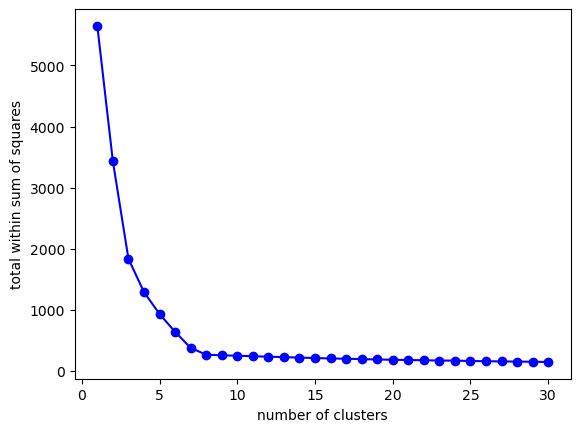

In [284]:
fig, ax = plt.subplots()

ax.plot( K, tots_within, 'bo-' )
ax.set_xlabel('number of clusters')
ax.set_ylabel('total within sum of squares')

plt.show()